In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from dtw import dtw
from scipy.spatial.distance import cosine

Importing the dtw module. When using in academic works please cite:
  T. Giorgino. Computing and Visualizing Dynamic Time Warping Alignments in R: The dtw Package.
  J. Stat. Soft., doi:10.18637/jss.v031.i07.



In [2]:
df = pd.read_csv('shifting_X_e_outputs.csv', header=None)
df.columns = [f'Y{i+1}' for i in range(len(df.columns))]
df

,Y1,Y2,Y3,Y4,Y5,Y6,Y7
0,3.35,3.350000,3.350000,676.286830,281.756472,245.147799,1
1,3.35,3.350000,3.350000,720.684757,300.253658,261.241642,1
2,3.35,3.350000,3.350000,586.905485,244.518171,212.747877,1
3,3.35,3.350000,3.350000,548.176282,228.382705,198.708895,1
4,3.35,3.088285,3.110782,173.035384,72.090476,62.723746,1
...,...,...,...,...,...,...,...
1375,3.35,3.289918,3.345917,806.311993,335.927912,292.280733,23
1376,3.35,3.295926,3.346325,493.080134,205.428396,178.737045,23
1377,3.35,3.301334,3.346693,606.072007,252.503380,219.695567,23
1378,3.35,3.306200,3.347023,674.689478,281.090979,244.568773,23


In [3]:
def ts_similarity(s1 = None, s2 = None, to_return = False, dist_type = 'euclidean'):
    
    
    if dist_type.lower() == 'euclidean':
        distance = np.sqrt(np.sum( (s1 - s2)**2, axis = 0))
    elif dist_type.lower() == 'dtw':
        distance = [dtw(s1[:, i], s2[:, i]).distance for i in range(s1.shape[1])]
    elif 'cosine' in dist_type.lower():
        distance = [cosine(s1[:, i], s2[:, i]) for i in range(s1.shape[1])]
                           
    if to_return:
        return distance  
    
    for i in range(s1.shape[1]):
            print(f'Feature: {i+1}, distance: {distance[i]}')   

In [155]:
def plot_all_outputs(df):
    _, axs = plt.subplots(6, 1, figsize=(14, 18))
    colours = ['b', 'g', 'r', 'k', 'c', 'y', 'm', 'tab:brown', 'tab:purple']
    k = 0 
    for sample in set(df['Y7']):
        sample_df = df[df['Y7'] == sample].drop('Y7', axis = 1)
        for i, col in enumerate(sample_df.columns):
            axs[i].plot(sample_df[col].values, c= colours[k % len(colours)])
            k += 1
            axs[i].set_title(f'{col}')
    
    plt.tight_layout()
    plt.show()

def hist_similarity(df, dist_type = 'euclidean', to_scale = True):
    _, axs = plt.subplots(6, 1, figsize=(14, 18))
    samples = list(set(df['Y7']))
    distances = []
    scaler = MinMaxScaler()

    # Scale the DataFrame excluding the 'Y7' column
    if to_scale:
        scaled_df = []
        for sample in sorted(set(df['Y7'])):
            sample_df = df[df['Y7'] == sample]
            scaled = np.concatenate([scaler.fit_transform(sample_df.values[:, :-1]), sample_df['Y7'].values.reshape(-1, 1)], axis = 1)
            scaled_df.append(scaled)

        scaled_df = pd.DataFrame(np.array(scaled_df).reshape(-1, len(df.columns)), columns=[f'Y{i+1}' for i in range(len(df.columns))])
    else:
        scaled_df = df
    
    sample_pairs = []  # To keep track of sample pairs for distances
    for i in range(len(samples)):
        sample_dfi = scaled_df[scaled_df['Y7'] == samples[i]].drop('Y7', axis=1)
        for j in range(i + 1, len(samples)):
            sample_dfj = scaled_df[scaled_df['Y7'] == samples[j]].drop('Y7', axis=1)
            distance = ts_similarity(sample_dfi.values, sample_dfj.values, to_return=True, dist_type=dist_type)
            distances.append(distance)
            sample_pairs.append((samples[i], samples[j]))  # Track sample pairs

    distances = np.array(distances)
    print(f"Total distance calculations: {len(distances)}")

    # Identify samples in the 0-bin for each dimension
    samples_in_non_0_bin = {f'Y{i + 1}': [] for i in range(6)}  # To store non-0-bin samples for each dimension
    colours = ['b', 'g', 'r', 'c', 'y', 'm', 'tab:brown', 'tab:purple']

    for i in range(6):
        if len(np.unique(distances[:, i])) <= 1:
            axs[i].set_title(f"Dimension {i}: Insufficient Variance")
            continue

        sns.histplot(distances[:, i], ax=axs[i], color=colours[i], kde=True, bins=10)  # Set bins to 10
        axs[i].set_title(f"Histogram of Similarity: Dimension {i + 1}")
        axs[i].set_xlabel("Distance")
        axs[i].set_ylabel("Frequency")

        # Get histogram bin edges with 10 bins
        _, bin_edges = np.histogram(distances[:, i], bins=10)

        # Check which samples fall into each non-zero bin
        zero_bin_min = bin_edges[0]
        zero_bin_max = bin_edges[1]
        for k, distance in enumerate(distances[:, i]):
            if zero_bin_min > distance or distance > zero_bin_max:
                samples_in_non_0_bin[f'Y{i + 1}'].append(sample_pairs[k])

    plt.tight_layout()
    plt.show()
    return samples_in_non_0_bin


def plot_pair(df, pair):
    sample_df = df[df['Y7'] == pair[0]].drop('Y7', axis=1)
    sample_df2 = df[df['Y7'] == pair[1]].drop('Y7', axis=1)

    for col in sample_df2:
        plt.plot(sample_df[col].values, c='blue', label=f"Sample {pair[0]}")
        plt.plot(sample_df2[col].values, c='red', label=f"Sample {pair[1]}")
        plt.legend()
        plt.show()

def correlation(df):
    for sample in set(df['Y7']):
        sample_df = df[df['Y7'] == sample].drop(['Y1', 'Y7'], axis = 1)
        sns.heatmap(sample_df.corr(), annot=True, fmt='.2f')
        plt.show()  

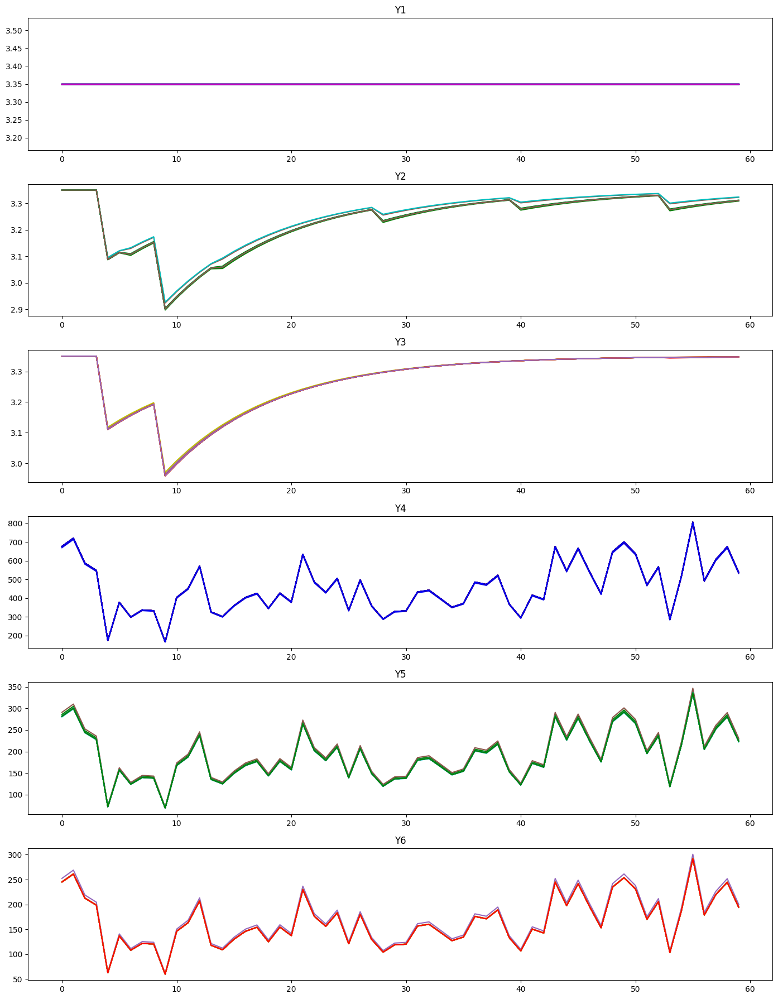

Total distance calculations: 253


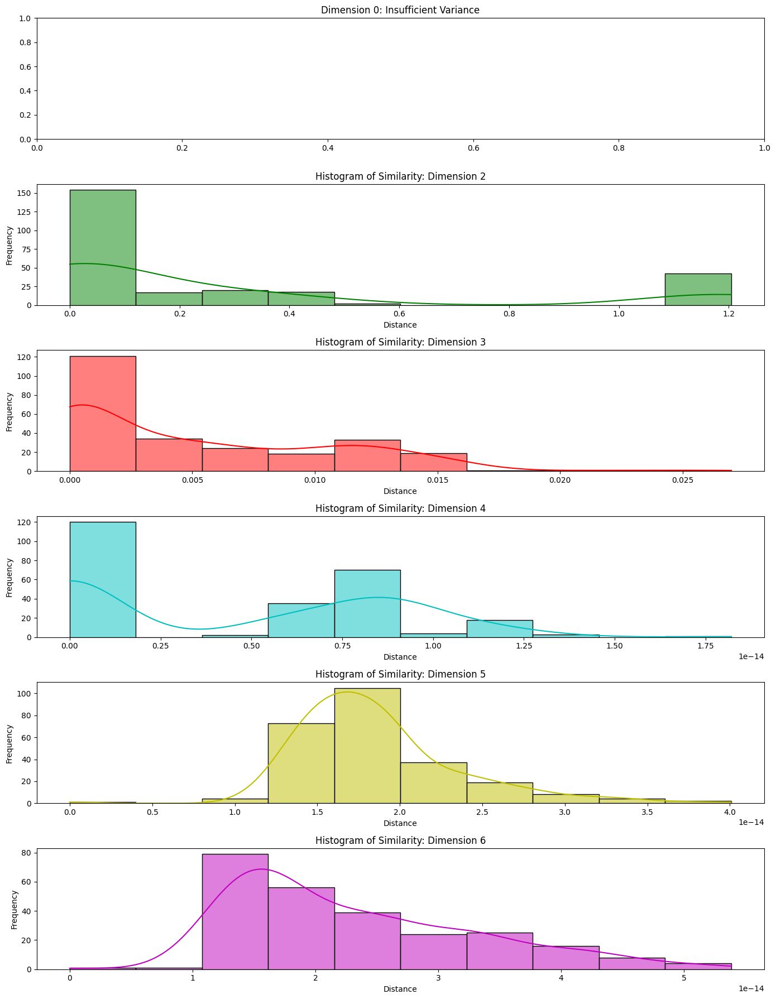

In [44]:
plot_all_outputs(df)
non_zero_bins = hist_similarity(df, dist_type='dtw', to_scale=True)

In [20]:
inputs_df = pd.read_csv('shifting_X_e.txt', header=None)
inputs_df.columns = [f'X{i+1}' for i in range(len(inputs_df.columns))]
inputs_df

,X1,X2,X3,X4,X5,X6,X7,X8,X9
0,0.37,0.73,0.100000,0.100000,0.100000,0.533,0.666,0.5,42.0
1,0.37,0.73,0.200000,0.100000,0.100000,0.533,0.666,0.5,42.0
2,0.37,0.73,0.110000,0.100000,0.100000,0.533,0.666,0.5,42.0
3,0.37,0.73,0.101000,0.100000,0.100000,0.533,0.666,0.5,42.0
4,0.37,0.73,0.100100,0.100000,0.100000,0.533,0.666,0.5,42.0
5,0.37,0.73,0.100010,0.100000,0.100000,0.533,0.666,0.5,42.0
6,0.37,0.73,0.100001,0.100000,0.100000,0.533,0.666,0.5,42.0
7,0.37,0.73,0.100000,0.100000,0.100000,0.533,0.666,0.5,42.0
8,0.37,0.73,0.100000,0.200000,0.100000,0.533,0.666,0.5,42.0
9,0.37,0.73,0.100000,0.110000,0.100000,0.533,0.666,0.5,42.0


In [81]:
non_zero_bins

{'Y1': [],
 'Y2': [(1, 2),
  (1, 9),
  (1, 16),
  (2, 3),
  (2, 4),
  (2, 5),
  (2, 6),
  (2, 7),
  (2, 8),
  (2, 9),
  (2, 10),
  (2, 11),
  (2, 12),
  (2, 13),
  (2, 14),
  (2, 15),
  (2, 16),
  (2, 17),
  (2, 18),
  (2, 19),
  (2, 20),
  (2, 21),
  (2, 22),
  (2, 23),
  (3, 9),
  (3, 16),
  (4, 9),
  (4, 16),
  (5, 9),
  (5, 16),
  (6, 9),
  (6, 16),
  (7, 9),
  (7, 16),
  (8, 9),
  (8, 16),
  (9, 10),
  (9, 11),
  (9, 12),
  (9, 13),
  (9, 14),
  (9, 15),
  (9, 16),
  (9, 17),
  (9, 18),
  (9, 19),
  (9, 20),
  (9, 21),
  (9, 22),
  (9, 23),
  (10, 16),
  (10, 17),
  (11, 16),
  (12, 16),
  (13, 16),
  (14, 16),
  (15, 16),
  (16, 17),
  (16, 18),
  (16, 19),
  (16, 20),
  (16, 21),
  (16, 22),
  (16, 23)],
 'Y3': [(1, 2),
  (1, 9),
  (1, 10),
  (1, 16),
  (2, 3),
  (2, 4),
  (2, 5),
  (2, 6),
  (2, 7),
  (2, 8),
  (2, 9),
  (2, 10),
  (2, 11),
  (2, 12),
  (2, 13),
  (2, 14),
  (2, 15),
  (2, 16),
  (2, 17),
  (2, 18),
  (2, 19),
  (2, 20),
  (2, 21),
  (2, 22),
  (2, 23),
  (3, 9

In [82]:
eps = 10e-7

m = dict()
for feature in non_zero_bins:
    m[feature] = set()
    for i, j in non_zero_bins[feature]:
        for k in range(2,5):
            
            if abs(inputs_df.iloc[i-1, k] - inputs_df.iloc[j-1, k]) > eps:
               print(abs(inputs_df.iloc[i-1, k] - inputs_df.iloc[j-1, k]), f'pair{(i,j)}', f'Xe: {k+1}', f'feature {feature}')

#or feature in m:
#   if len(m[feature]) > 0:
#       print(feature, min(m[feature]))

0.1 pair(1, 2) Xe: 3 feature Y2
0.1 pair(1, 9) Xe: 4 feature Y2
0.1 pair(1, 16) Xe: 5 feature Y2
0.09000000000000001 pair(2, 3) Xe: 3 feature Y2
0.099 pair(2, 4) Xe: 3 feature Y2
0.09990000000000002 pair(2, 5) Xe: 3 feature Y2
0.09999000000000001 pair(2, 6) Xe: 3 feature Y2
0.099999 pair(2, 7) Xe: 3 feature Y2
0.09999990000000002 pair(2, 8) Xe: 3 feature Y2
0.1 pair(2, 9) Xe: 3 feature Y2
0.1 pair(2, 9) Xe: 4 feature Y2
0.1 pair(2, 10) Xe: 3 feature Y2
0.009999999999999995 pair(2, 10) Xe: 4 feature Y2
0.1 pair(2, 11) Xe: 3 feature Y2
0.0010000000000000009 pair(2, 11) Xe: 4 feature Y2
0.1 pair(2, 12) Xe: 3 feature Y2
9.999999999998899e-05 pair(2, 12) Xe: 4 feature Y2
0.1 pair(2, 13) Xe: 3 feature Y2
9.999999999996123e-06 pair(2, 13) Xe: 4 feature Y2
0.1 pair(2, 14) Xe: 3 feature Y2
1.000000000001e-06 pair(2, 14) Xe: 4 feature Y2
0.1 pair(2, 15) Xe: 3 feature Y2
0.1 pair(2, 16) Xe: 3 feature Y2
0.1 pair(2, 16) Xe: 5 feature Y2
0.1 pair(2, 17) Xe: 3 feature Y2
0.009999999999999995 pair(2,

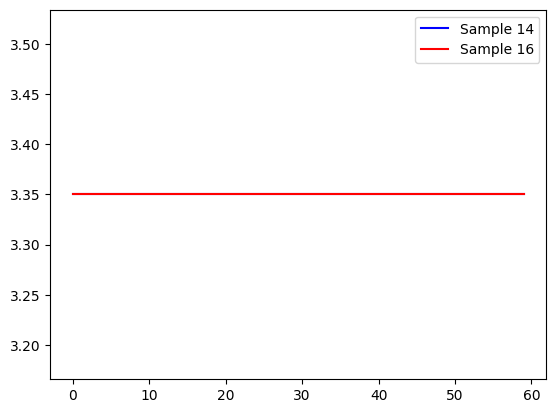

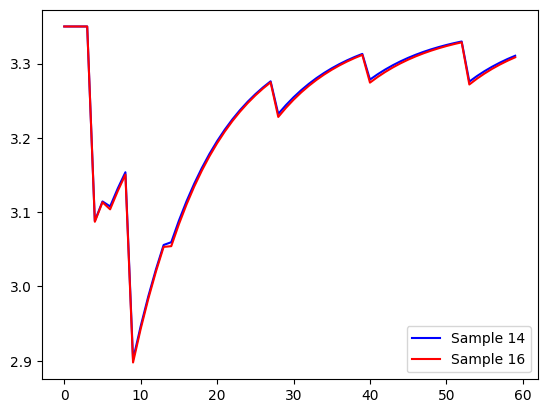

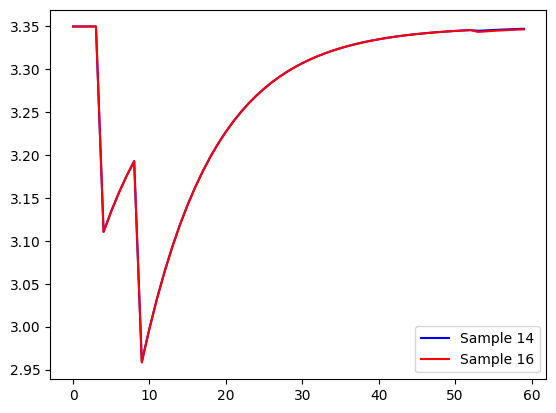

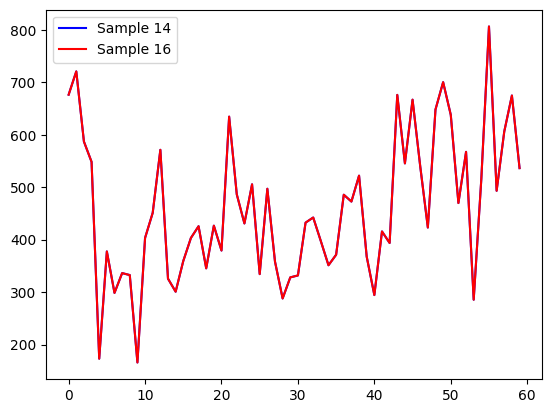

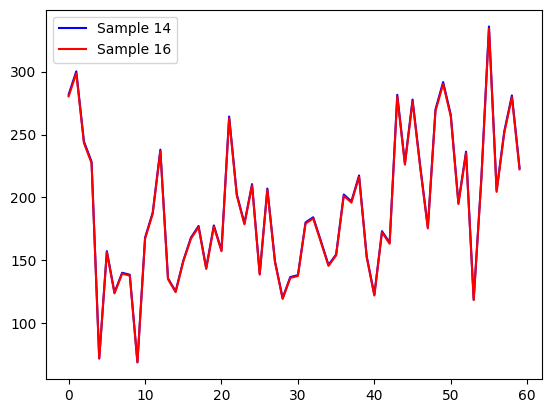

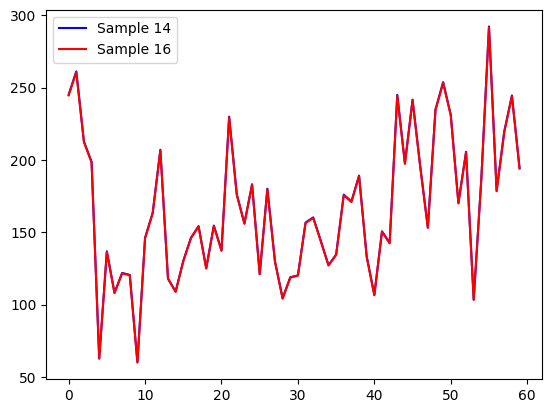

In [83]:
plot_pair(df, (14,16))

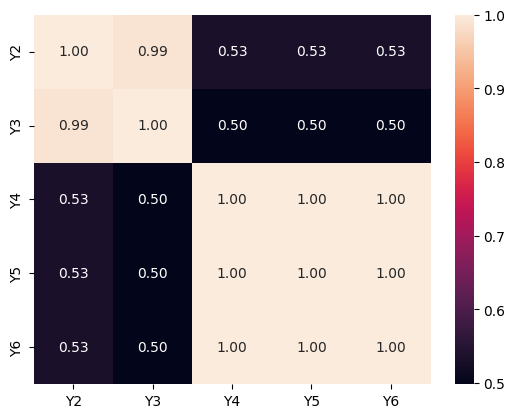

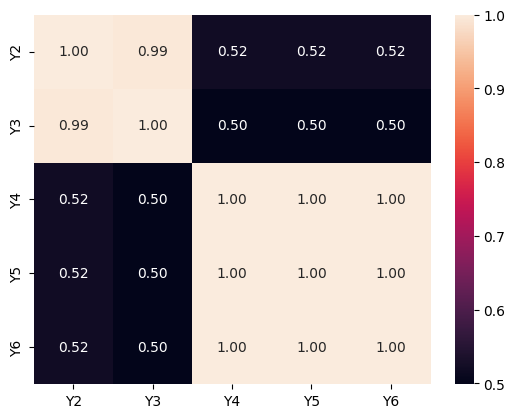

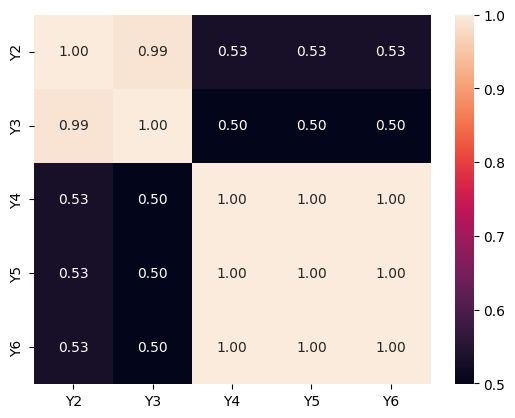

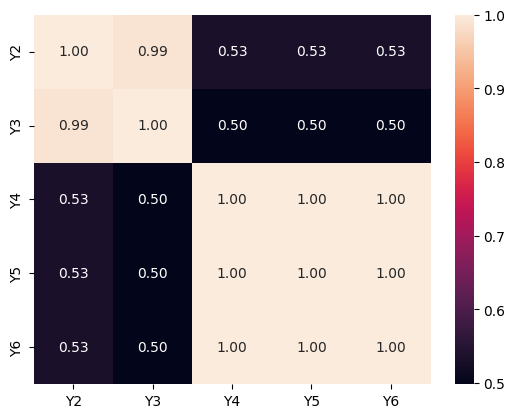

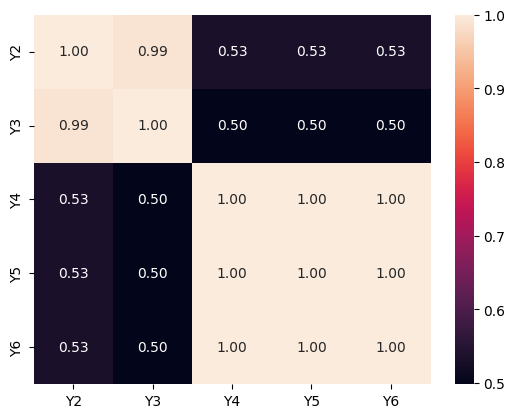

...

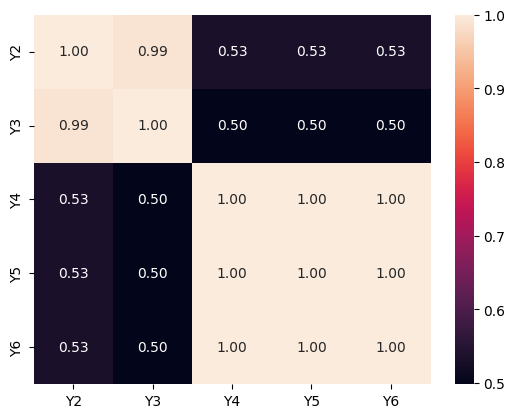

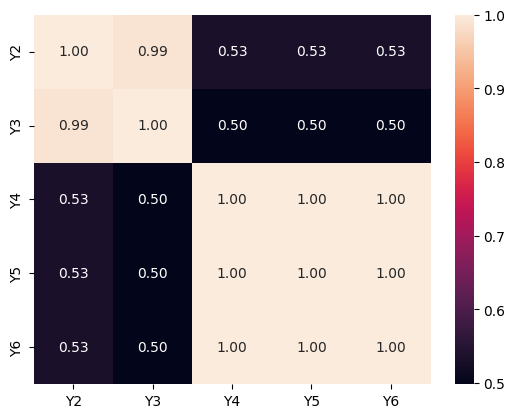

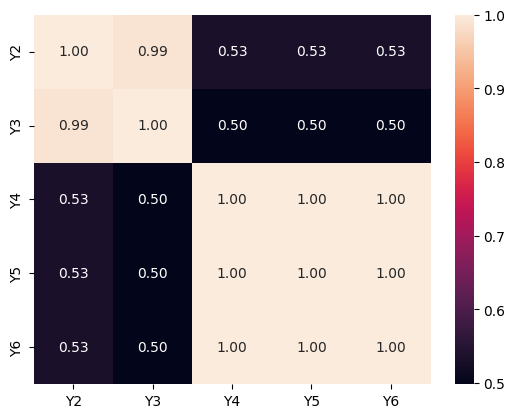

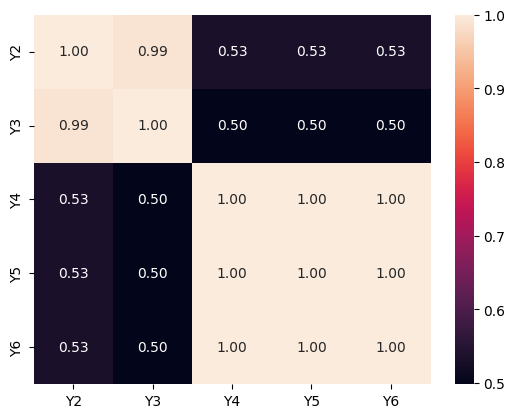

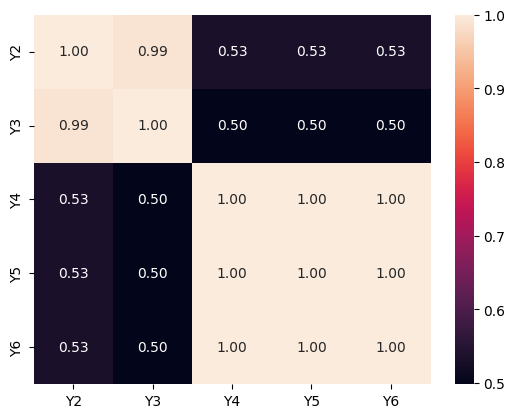

In [6]:
correlation(df)

In [110]:
def plot_all_outputs_based_on_inputs(df, df_inputs):
    
    _, axs = plt.subplots(6, 3, figsize=(16, 18))
    colours = ['b', 'g', 'r', 'k', 'c', 'y', 'm', 'tab:brown', 'tab:purple']
    k = 0
    
    for j in range(3):
        sample_ep = set(df['Y7'].iloc[j*420:(j+1)*420])
        for sample in sample_ep:
            sample_df = df[df['Y7'] == sample].drop('Y7', axis = 1)
            
            for i, col in enumerate(sample_df.columns):
                axs[i][j].plot(sample_df[col].values, c= colours[k % len(colours)])
                k += 1
                axs[i][j].set_title(f'{col}')
    
    plt.tight_layout()
    plt.show()

     X1    X2        X3   X4   X5     X6     X7   X8    X9
0  0.37  0.73  0.100000  0.1  0.1  0.533  0.666  0.5  42.0
1  0.37  0.73  0.200000  0.1  0.1  0.533  0.666  0.5  42.0
2  0.37  0.73  0.110000  0.1  0.1  0.533  0.666  0.5  42.0
3  0.37  0.73  0.101000  0.1  0.1  0.533  0.666  0.5  42.0
4  0.37  0.73  0.100100  0.1  0.1  0.533  0.666  0.5  42.0
5  0.37  0.73  0.100010  0.1  0.1  0.533  0.666  0.5  42.0
6  0.37  0.73  0.100001  0.1  0.1  0.533  0.666  0.5  42.0
      X1    X2   X3        X4   X5     X6     X7   X8    X9
7   0.37  0.73  0.1  0.100000  0.1  0.533  0.666  0.5  42.0
8   0.37  0.73  0.1  0.200000  0.1  0.533  0.666  0.5  42.0
9   0.37  0.73  0.1  0.110000  0.1  0.533  0.666  0.5  42.0
10  0.37  0.73  0.1  0.101000  0.1  0.533  0.666  0.5  42.0
11  0.37  0.73  0.1  0.100100  0.1  0.533  0.666  0.5  42.0
12  0.37  0.73  0.1  0.100010  0.1  0.533  0.666  0.5  42.0
13  0.37  0.73  0.1  0.100001  0.1  0.533  0.666  0.5  42.0
      X1    X2   X3   X4        X5     X6     X7

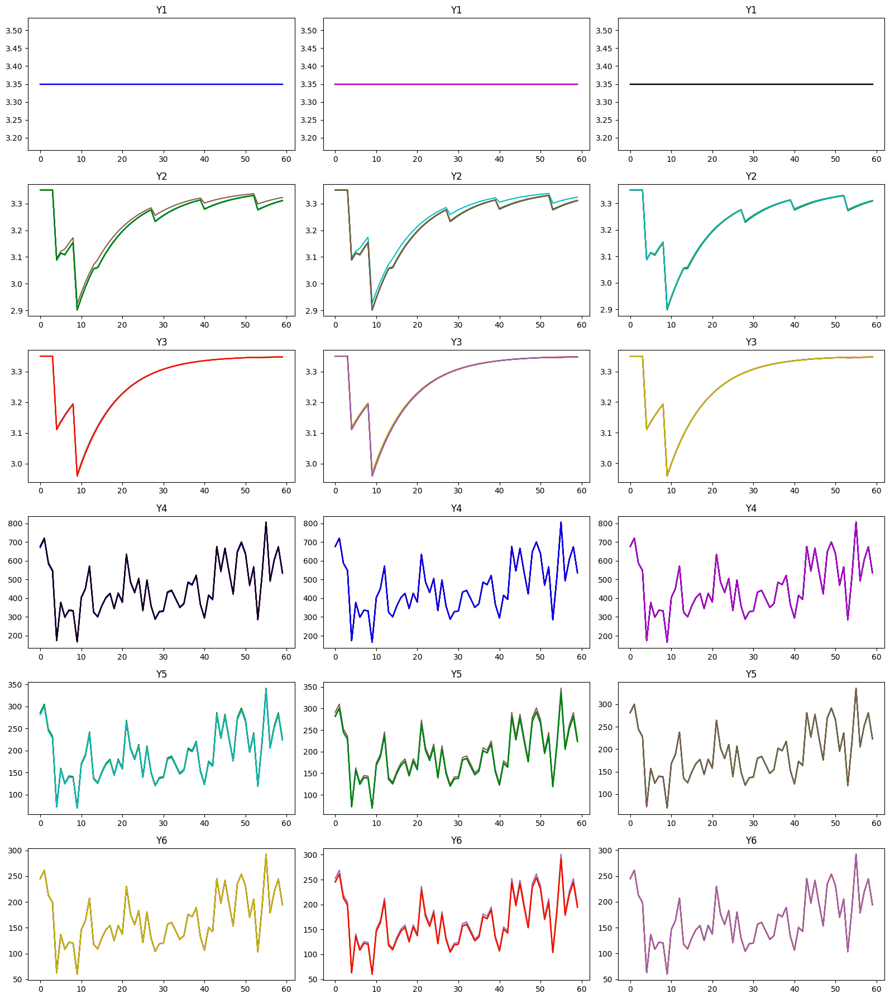

In [58]:
plot_all_outputs_based_on_inputs(df, df_inputs=inputs_df)

In [102]:
def correlation_between_ts(df):
    fig, axs = plt.subplots(2, 3, figsize=(16, 12))
    perm = set()
    k, l = 0, 0
    
    for i in range(3):
        for j in range(i, 3):  # Avoid redundant pairs
            if (i, j) in perm or (j, i) in perm:  # Check both orderings
                continue
            
            perm.add((i, j))
            
            # Extract samples
            samples_i = df[(df['Y7'] > i * 7) & (df['Y7'] <= (i + 1) * 7)].drop('Y7', axis=1)
            samples_j = df[(df['Y7'] > j * 7) & (df['Y7'] <= (j + 1) * 7)].drop('Y7', axis=1)
            
            # Compute correlation matrix
            combined_samples = pd.concat([samples_i, samples_j])
            corr_matrix = combined_samples.corr()
            
            # Plot heatmap
            sns.heatmap(corr_matrix, ax=axs[k, l], annot=True, fmt=".2f", cmap="coolwarm")
            axs[k, l].set_title(f"Correlation: Group {i+1} (Samples {i*7+1} to {(i+1)*7})\nvs\nGroup {j+1} (Samples {j*7+1} to {(j+1)*7})")
            
            # Update subplot indices
            l += 1
            if l >= 3:
                l = 0
                k += 1
    
    plt.tight_layout()
    plt.show()

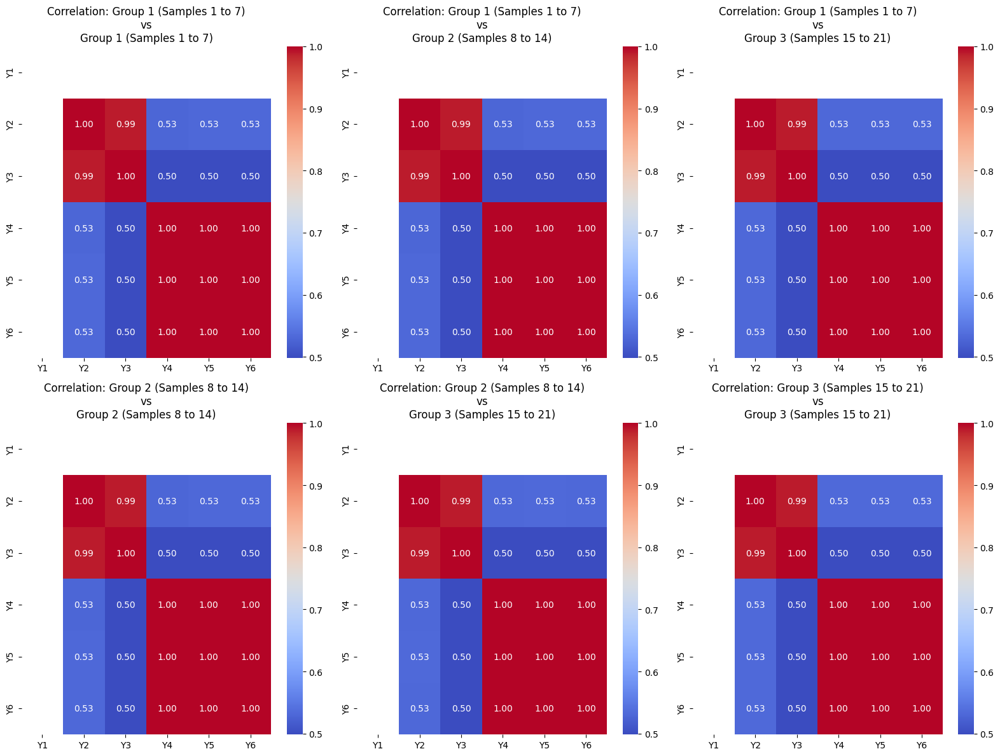

In [20]:
correlation_between_ts(df)

In [172]:
def ts_similarity_all(df, dist_type = 'euclidean'):
    sim_dfs = []
    for i in range(3):
        sample_df = df[(df['Y7'] > i*7) & (df['Y7'] <= (i+1)*7)]
        labels = []
        values = dict()
        for k in range(i*7 + 1, (i+1)*7 + 1):
            for l in range(k, (i+1)*7 + 1):
                sk = sample_df[sample_df['Y7'] == k].drop('Y7', axis = 1).values
                sl = sample_df[sample_df['Y7'] == l].drop('Y7', axis = 1).values
                dist = ts_similarity(sk, sl, to_return=True, dist_type=dist_type)
                for f in range(6):
                    if f'Y{f+1}' not in values:
                        values[f'Y{f+1}'] = []
                    values[f'Y{f+1}'].append(dist[f])
                    
                labels.append(f'{k} vs {l}')
        
        sim_dfs.append(pd.DataFrame(index=labels, data=values))
    
    return sim_dfs

def create_group(sim_df, xe = 3):
    idx = sim_df.index

    pairs = [tuple(map(int, x.split(' vs '))) for x in idx]

    new_rows = []

    for i in range(7*(xe-3)+1, 7*(xe-2)+1):
        for j in range(7*(xe-3)+1, 7*(xe-2)+1):
            diff = inputs_df[f'X{xe}'].iloc[i-1] - inputs_df[f'X{xe}'].iloc[j-1]
            new_rows.append((f"{i} vs {j}", diff))

    # Convert to DataFrame
    xe_diff = pd.DataFrame(new_rows, columns=["Index", "X_diff"]).set_index("Index").sort_index()

    # Duplicate sim_dfs[0] rows for both "i vs j" and "j vs i"
    sim_dfs_expanded = sim_df.loc[idx].copy()  # Copy original
    sim_dfs_reversed = sim_df.copy()  # Copy for reversed indices
    sim_dfs_reversed.index = [f"{j} vs {i}" for i, j in pairs]  # Swap indices

    # Merge both original and reversed while dropping duplicate indices
    sim_dfs_full = pd.concat([sim_dfs_expanded, sim_dfs_reversed]).sort_index()
    sim_dfs_full = sim_dfs_full[~sim_dfs_full.index.duplicated(keep='first')]  # Drop duplicate indices

    # Concatenate with computed X3 differences
    d1 = pd.concat([sim_dfs_full, xe_diff], axis=1)

    # Ensure correct indexing
    d1 = d1.loc[xe_diff.index]  # Keep only matching indices
    return d1

def is_group(group, xe, col = 'Y4'):
    g = dict()
    for i in range(7*(xe-3)+1, 7*(xe-2)+1):
        for j in range(7*(xe-3)+1, 7*(xe-2)+1):
           id = f'{i} vs {j}'
           left_pairs = [f'{i} vs {k}' for k in range(7*(xe-3)+1, 7*(xe-2)+1)]
           right_pairs = [f'{k} vs {j}' for k in range(7*(xe-3)+1, 7*(xe-2)+1)]
           pairs = zip(left_pairs, right_pairs)

           g[id] = []
           for idl, idr in pairs:
               g[id].append([(sign(group.loc[id], col), -sign(group.loc[idl], col),  -sign(group.loc[idr], col)), 0])
               g[id][-1][-1] = sum(g[id][-1][0])
    
    total_diff = 0
    for val in g.values():
        total_diff += sum([s for _, s in val])
    
    return total_diff

def is_monotone(df, inputs_df, xe):
    result_df = pd.DataFrame()  # Initialize empty DataFrame

    if xe == 'X3' or xe == 3:
        xe = ['X3', 'X4', 'X5']
    else:
        xe = ['X6', 'X7', 'X8']

    print(xe)

    for i in range(3):
        # Select corresponding samples
        sample_df = df[(df['Y7'] > i * 7) & (df['Y7'] <= (i + 1) * 7)]
        input_df = inputs_df[(inputs_df.index > i * 7) & (inputs_df.index <= (i + 1) * 7)]

        result_inputs = []
        result_vals = []
        input_pairs = []
        idx = []
        # Compare all pairs within the sample
        for j in range(len(input_df)):
            for k in range(j + 1, len(input_df)):
                # Store input monotonicity and actual input values
                result_inputs.append(input_df[xe[i]].iloc[j] >= input_df[xe[i]].iloc[k])
                input_pairs.append((input_df[xe[i]].iloc[j], input_df[xe[i]].iloc[k]))
                idx.append((i*7+j, i*7+k))
                # Store feature-wise output monotonicity
                l = sample_df[sample_df['Y7'] == (i*7) + j+1].drop('Y7', axis = 1).values
                r = sample_df[sample_df['Y7'] == (i*7) + k+1].drop('Y7', axis = 1).values
                result_vals.append(l >= r)

        # Convert list of Series into a DataFrame
        print(result_vals)
        temp_df = pd.DataFrame(result_vals, columns=[f'Y{i+1}' for i in range(6)])
        temp_df.insert(0, 'Input_Monotonicity', result_inputs)
        temp_df.insert(1, 'Inputs_Pair', idx)
        temp_df.insert(2, 'Inputs_Pair_vals', input_pairs)
        

        # Append to the main DataFrame
        result_df = pd.concat([result_df, temp_df], ignore_index=True)

    return result_df
        
        

def sign(row, col = 'Y4'):
    if row['X_diff'] >= 0:
           return row[col]
    else:
        return -row[col]

In [84]:
sim_dfs = ts_similarity_all(df)

In [32]:
sim_dfs[0]

,Y1,Y2,Y3,Y4,Y5,Y6
1 vs 1,0.0,0.000000,0.000000e+00,0.000000,0.000000,0.000000
1 vs 2,0.0,0.122232,1.690313e-02,36.837273,23.630375,1.688827
1 vs 3,0.0,0.011905,2.340847e-03,3.682109,2.267098,0.060252
1 vs 4,0.0,0.001187,2.310748e-04,0.368195,0.225684,0.008420
1 vs 5,0.0,0.000119,2.307729e-05,0.036819,0.022558,0.000866
1 vs 6,0.0,0.000012,2.307427e-06,0.003682,0.002256,0.000087
1 vs 7,0.0,0.000001,2.307397e-07,0.000368,0.000226,0.000009
2 vs 2,0.0,0.000000,0.000000e+00,0.000000,0.000000,0.000000
2 vs 3,0.0,0.110327,1.523310e-02,33.155164,21.363277,1.749078
2 vs 4,0.0,0.121045,1.673113e-02,36.469078,23.404691,1.697246


In [19]:
sim_dfs[1]

,Y1,Y2,Y3,Y4,Y5,Y6
8 vs 9,0.0,0.138294,2.976883e-02,0.000037,50.293779,40.161704
8 vs 10,0.0,0.014260,3.967170e-03,0.000037,5.148632,4.100813
8 vs 11,0.0,0.001430,4.816467e-04,0.000037,0.516068,0.410939
8 vs 12,0.0,0.000143,4.815727e-05,0.000037,0.051599,0.041103
8 vs 13,0.0,0.000014,4.795094e-06,0.000037,0.005140,0.004111
8 vs 14,0.0,0.000001,4.587442e-07,0.000037,0.000494,0.000412
9 vs 10,0.0,0.124035,2.659623e-02,0.000000,45.145147,36.060890
9 vs 11,0.0,0.136864,2.943231e-02,0.000000,49.777711,39.750764
9 vs 12,0.0,0.138151,2.973500e-02,0.000000,50.242180,40.120600
9 vs 13,0.0,0.138280,2.976546e-02,0.000000,50.288639,40.157592


In [89]:
d1 = create_group(sim_dfs[0], xe = 3)
d2 = create_group(sim_dfs[1], xe = 4)
d3 = create_group(sim_dfs[2], xe = 5)


49 49
49 49
49 49


In [90]:
print(is_group(d1, xe = 3))
print(is_group(d2, xe = 4))
print(is_group(d3, xe = 5))

0.0
0.0
0.0


# Multiple examples with Uniform dist.

In [92]:
dfs = [pd.read_csv(f'Y_out{i}.csv', header=None) for i in range(2, 12)]
for df in dfs:
    df.columns = [f'Y{i}' for i in range(1, 8)]
input_dfs = [pd.read_csv(f'shifting_X_e{i}.txt', header=None) for i in range(2, 12)]
for df in input_dfs:
    df.columns = [f'X{i}' for i in range(1, 10)]


In [93]:
dfs[3]

,Y1,Y2,Y3,Y4,Y5,Y6,Y7
0,3.35,3.35,3.35,2202.285157,630.264800,562.168469,1
1,3.35,3.35,3.35,2197.165931,628.799745,560.861704,1
2,3.35,3.35,3.35,2338.718735,669.310280,596.995319,1
3,3.35,3.35,3.35,2034.168671,582.152092,519.254050,1
4,3.35,3.35,3.35,2657.623383,760.576561,678.400825,1
...,...,...,...,...,...,...,...
1375,3.35,3.35,3.35,2428.754997,695.077464,619.978513,23
1376,3.35,3.35,3.35,2470.127862,706.917829,630.539598,23
1377,3.35,3.35,3.35,2241.635803,641.526433,572.213350,23
1378,3.35,3.35,3.35,2812.935832,805.024923,718.046809,23


In [101]:
sims = [ts_similarity_all(df, dist_type='cosine') for df in dfs]
groups = [(create_group(sim_dfs[0], xe = 3),
            create_group(sim_dfs[1], xe = 4),
            create_group(sim_dfs[2], xe = 5)) for sim_dfs in sims]

for i, (d1, d2, d3) in enumerate(groups):
    print(f'Data {i+2}')
    print(is_group(d1, xe = 3))
    print(is_group(d2, xe = 4))
    print(is_group(d3, xe = 5))
    print('*'*20)

Data 2
0.0
0.0
0.0
********************
Data 3
0.0
0.0
0.0
********************
Data 4
0.0
0.0
0.0
********************
Data 5
0.0
0.0
0.0
********************
Data 6
0.0
0.0
0.0
********************
Data 7
0.0
0.0
0.0
********************
Data 8
0.0
0.0
0.0
********************
Data 9
0.0
0.0
0.0
********************
Data 10
0.0
0.0
0.0
********************
Data 11
0.0
0.0
0.0
********************


In [106]:
groups[1][0]

,Y1,Y2,Y3,Y4,Y5,Y6,X_diff
Index,,,,,,,
1 vs 1,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000
1 vs 2,0.0,0.0,0.0,0.000000e+00,1.110223e-16,3.330669e-16,-0.100000
1 vs 3,0.0,0.0,0.0,0.000000e+00,4.440892e-16,2.220446e-16,-0.010000
1 vs 4,0.0,0.0,0.0,0.000000e+00,2.220446e-16,2.220446e-16,-0.001000
1 vs 5,0.0,0.0,0.0,0.000000e+00,0.000000e+00,3.330669e-16,-0.000100
1 vs 6,0.0,0.0,0.0,0.000000e+00,0.000000e+00,2.220446e-16,-0.000010
1 vs 7,0.0,0.0,0.0,0.000000e+00,2.220446e-16,2.220446e-16,-0.000001
2 vs 1,0.0,0.0,0.0,0.000000e+00,1.110223e-16,3.330669e-16,0.100000
2 vs 2,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000


Data 2


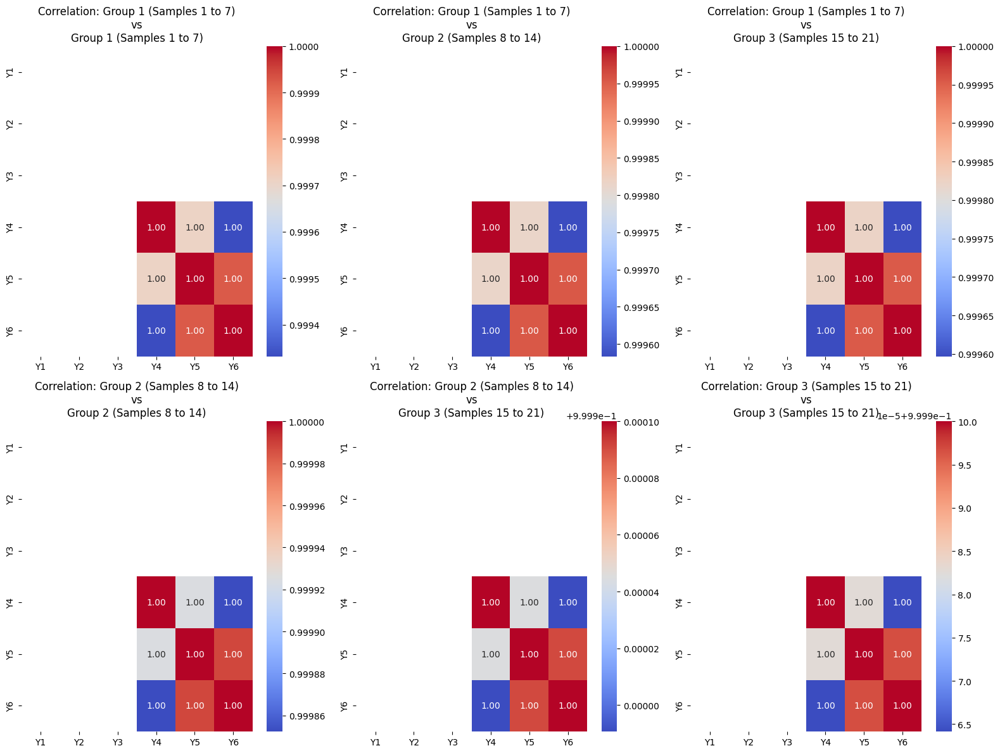

Data 3


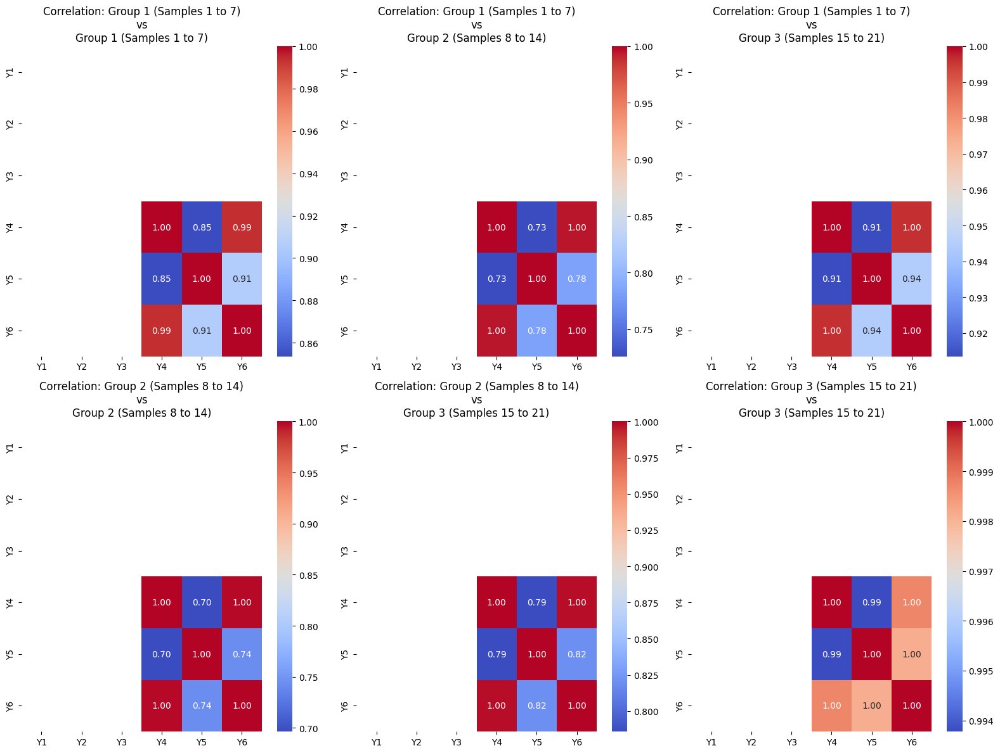

Data 4


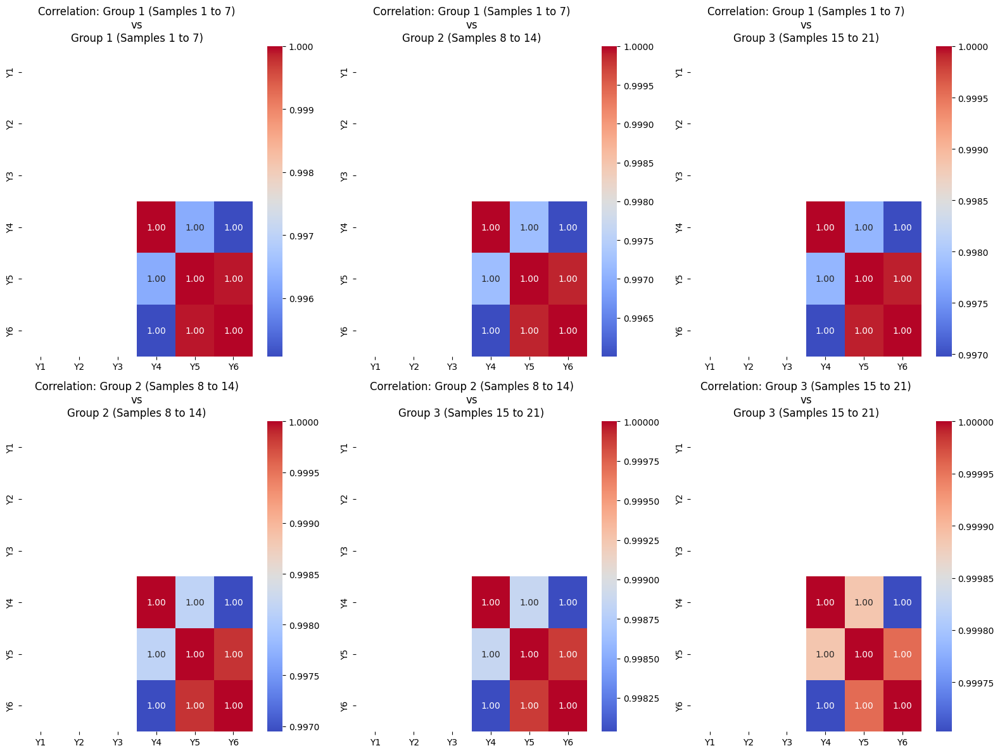

Data 5


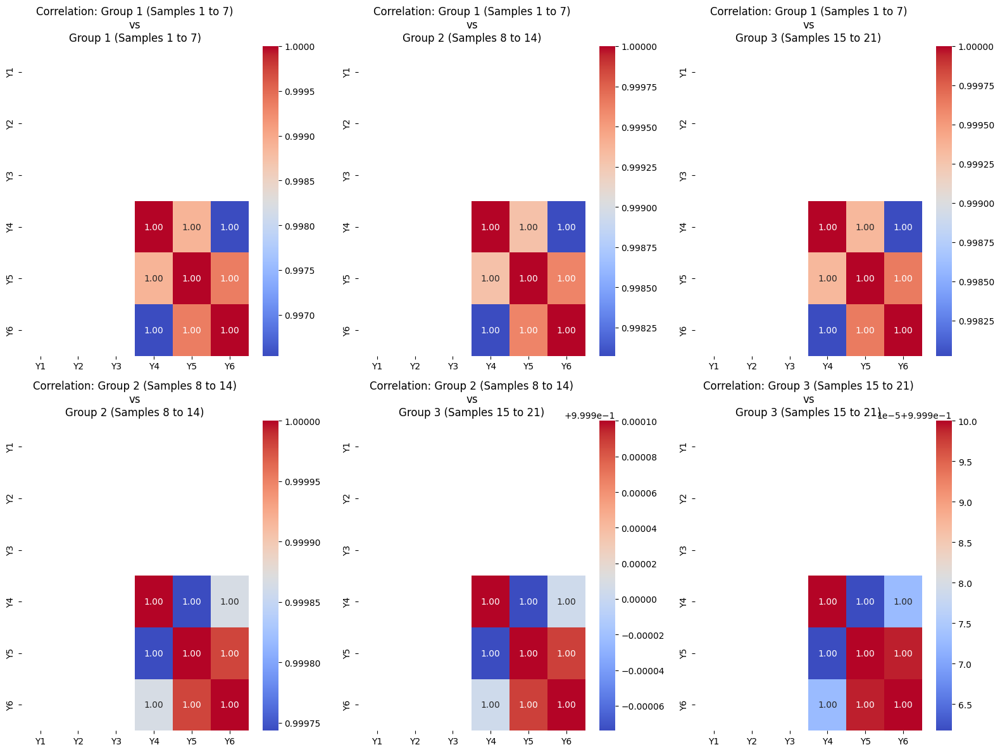

Data 6


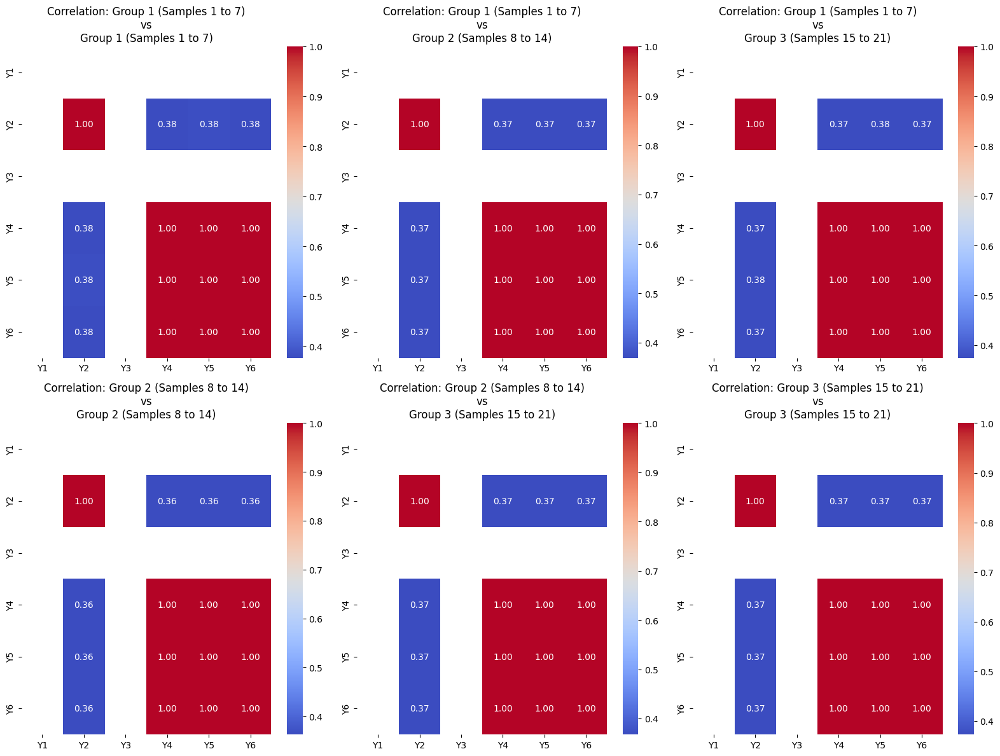

Data 7


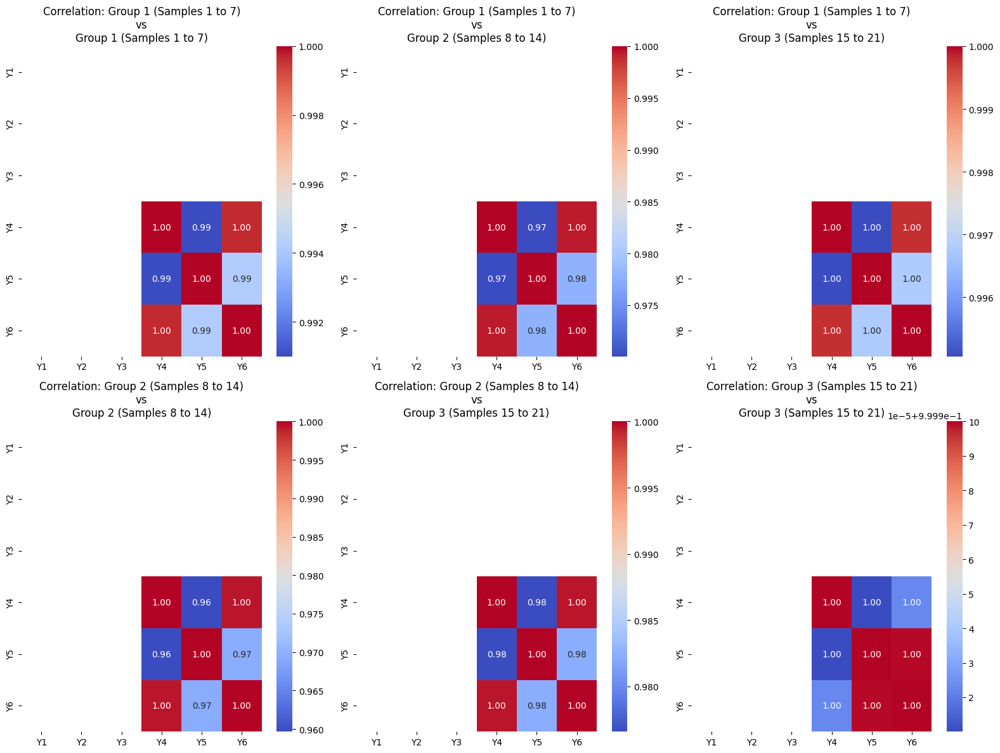

Data 8


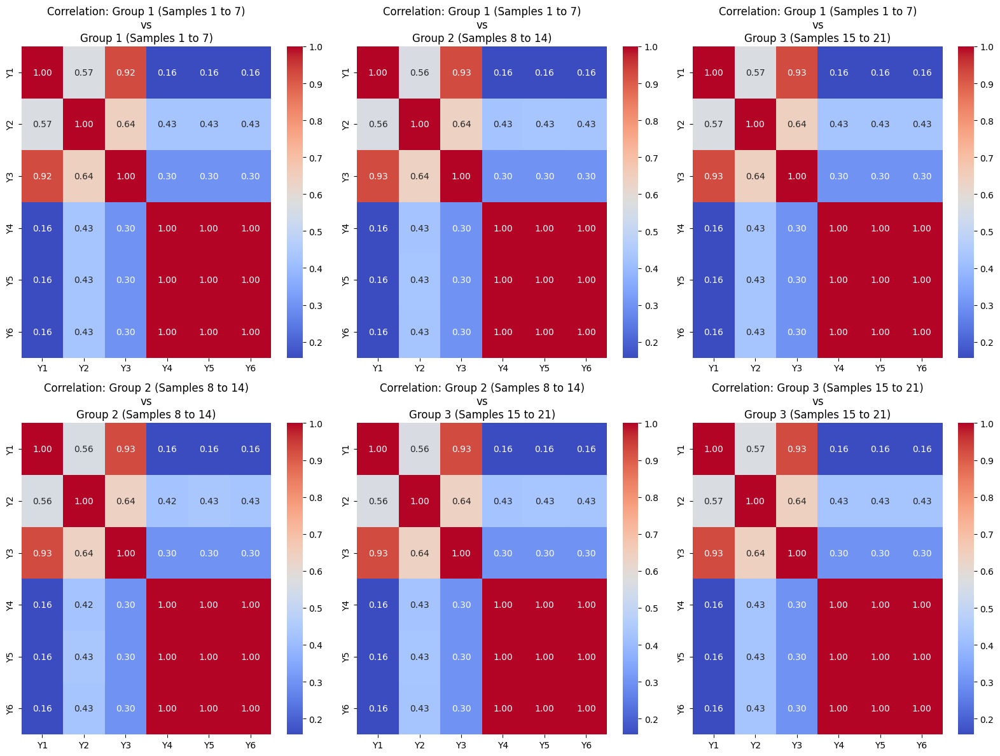

Data 9


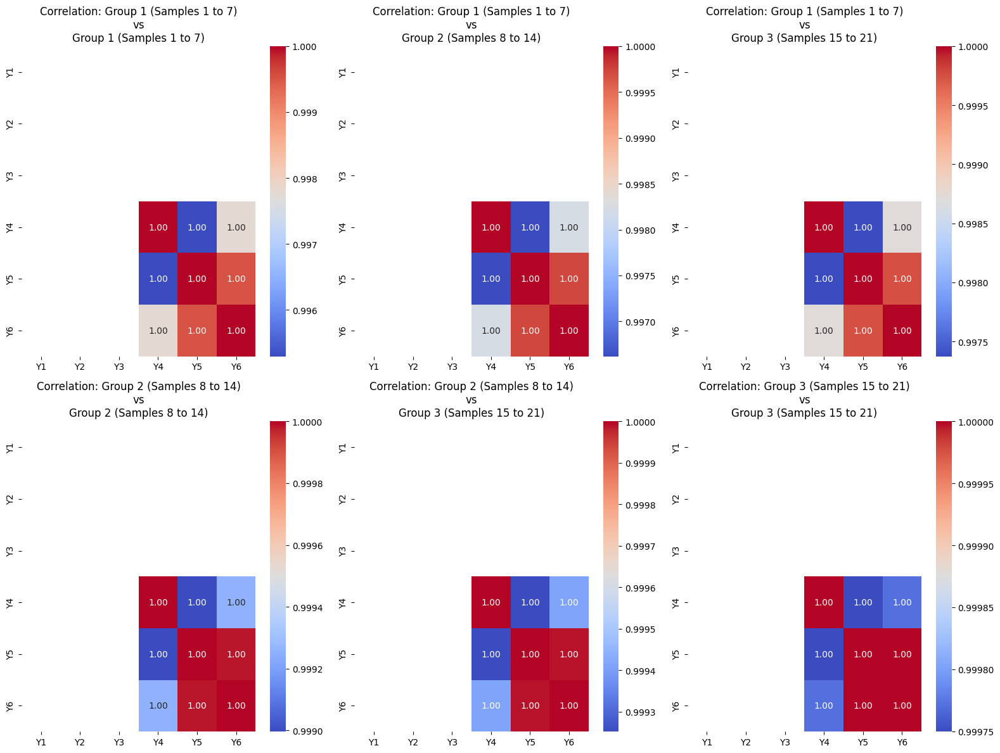

Data 10


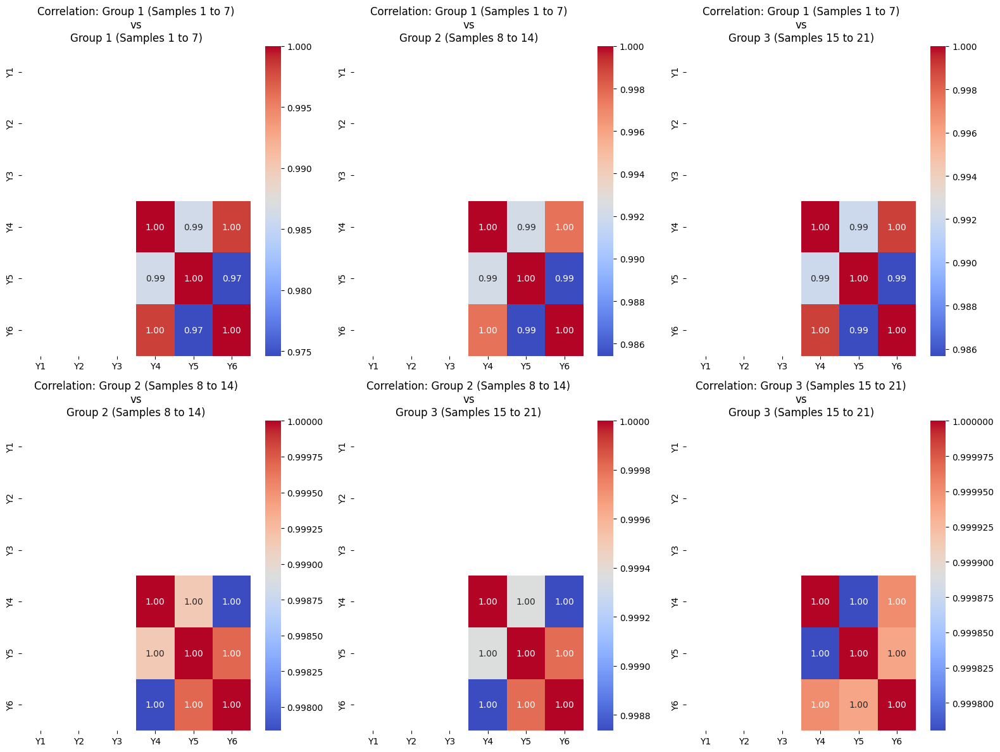

Data 11


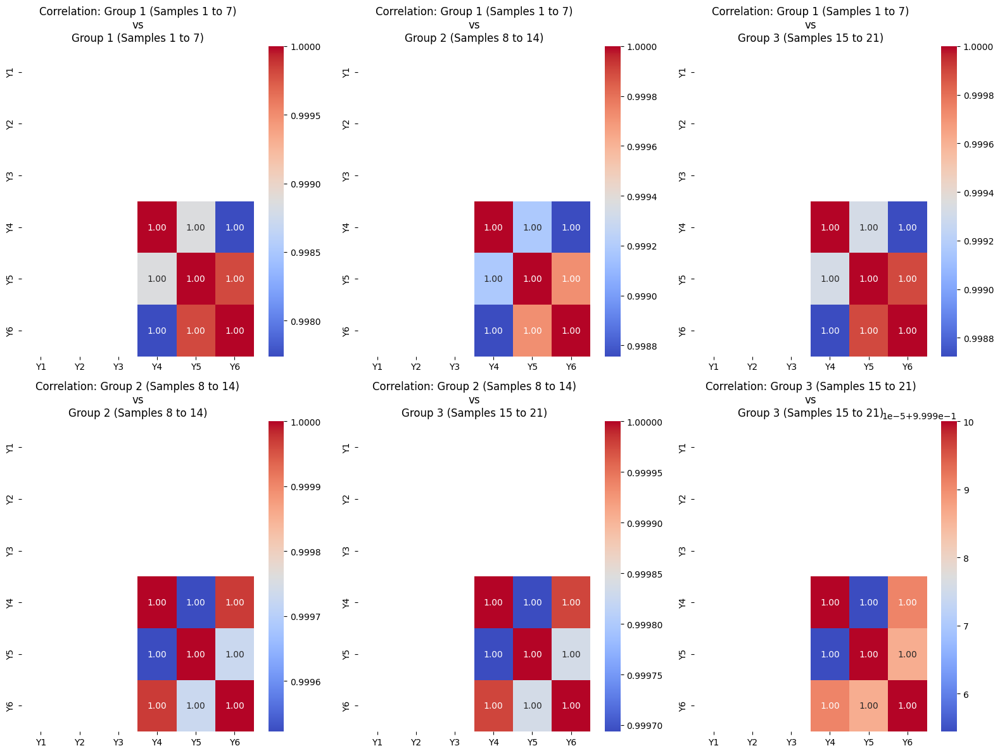

In [105]:
for i, df in enumerate(dfs):
    print(f'Data {i+2}')
    correlation_between_ts(df)

Data2


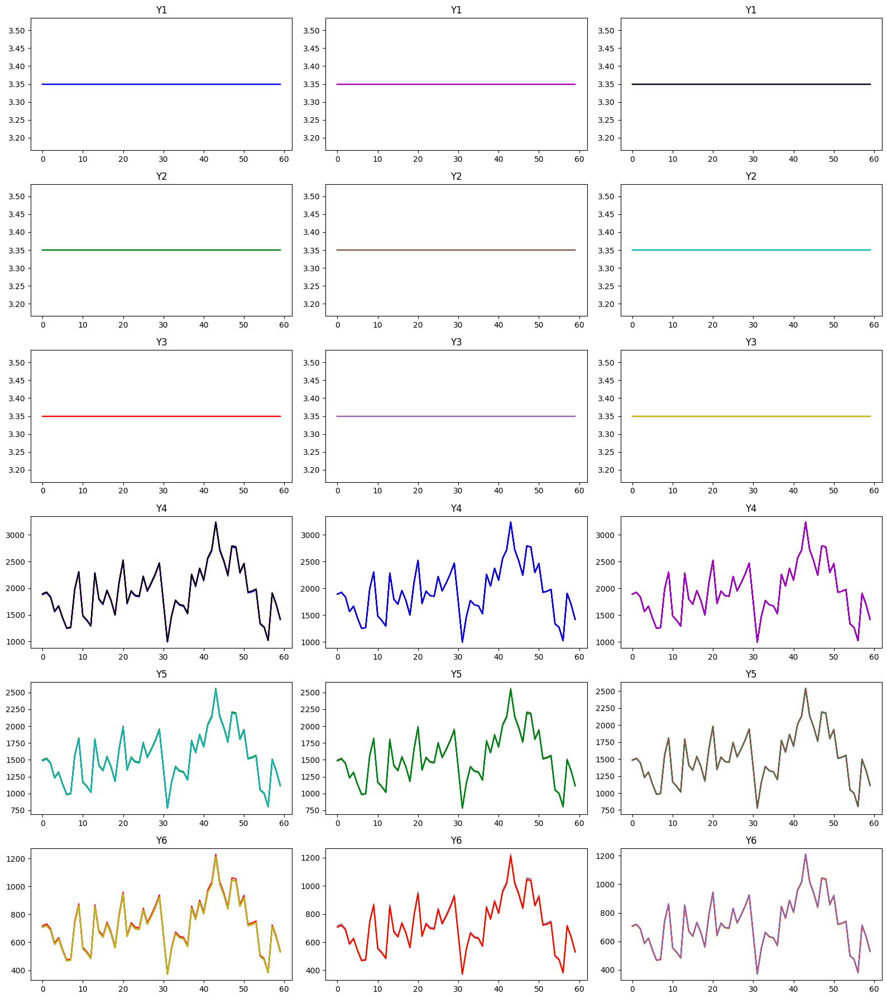

Data3


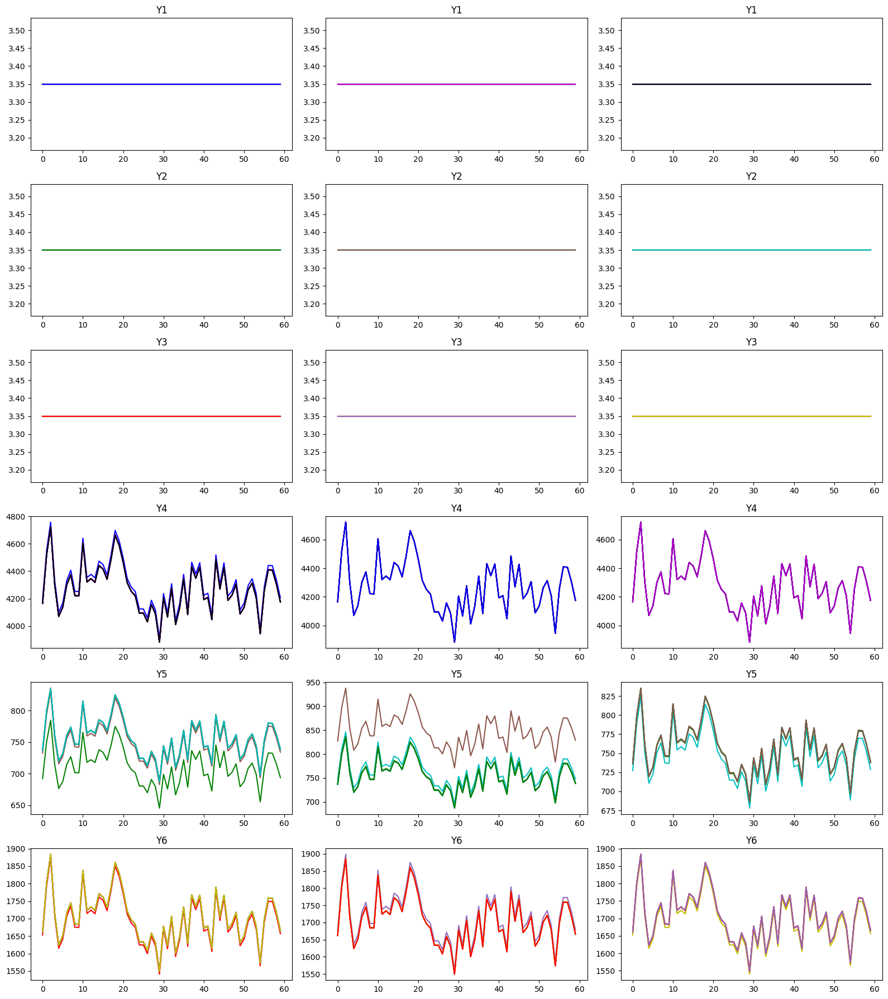

Data4


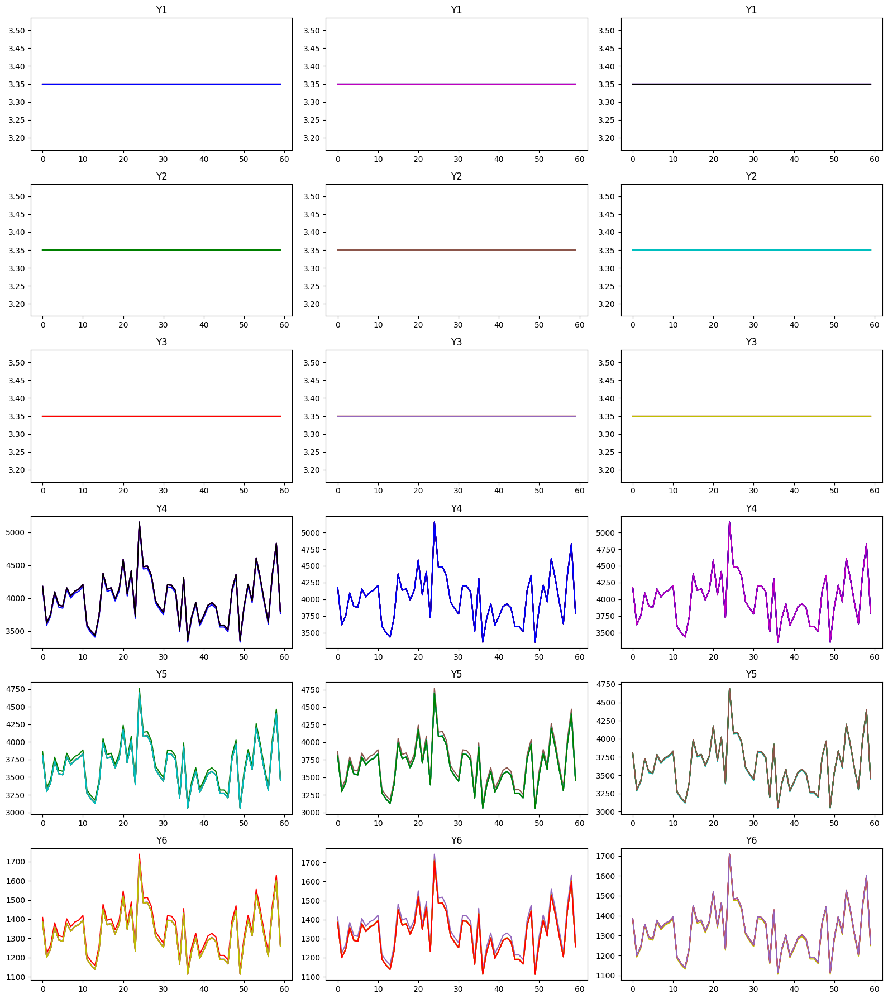

Data5


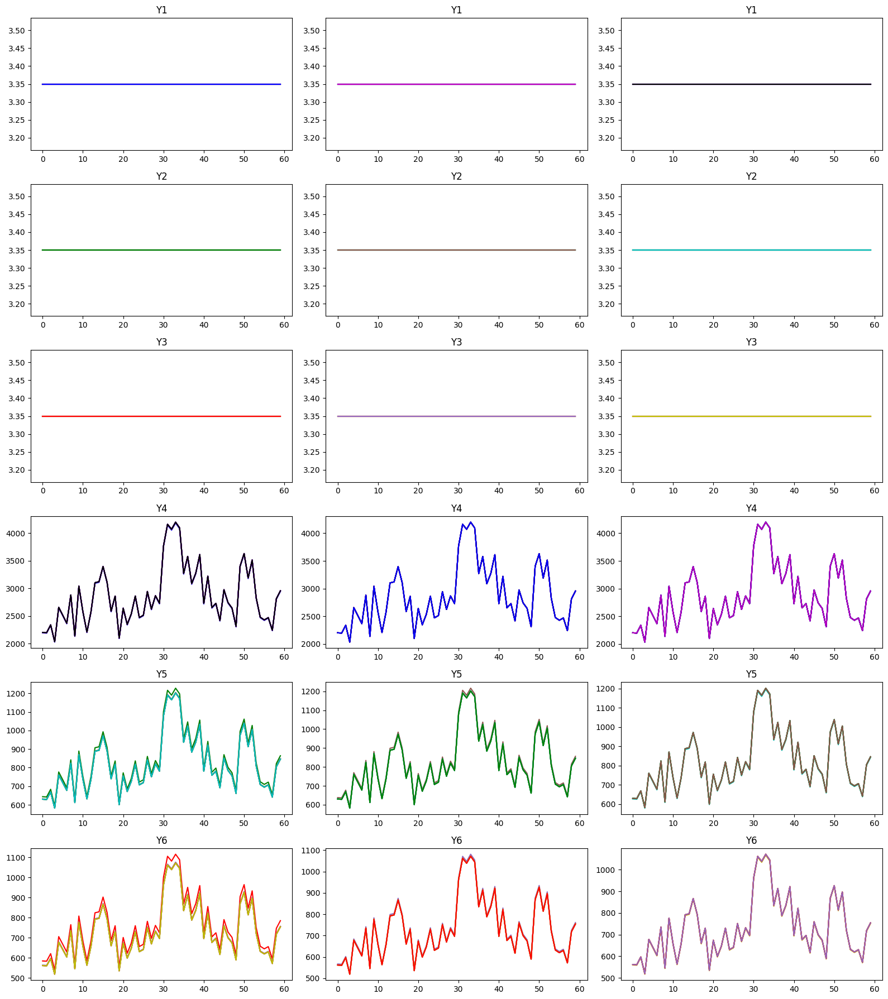

Data6


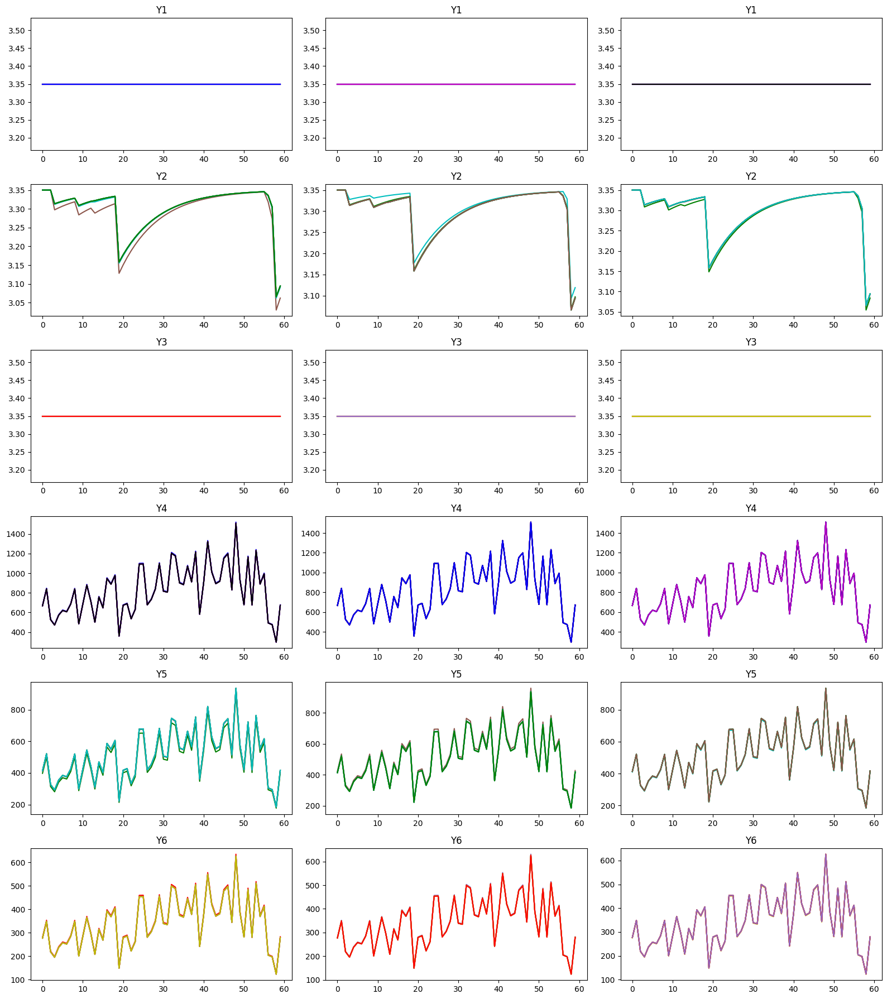

Data7


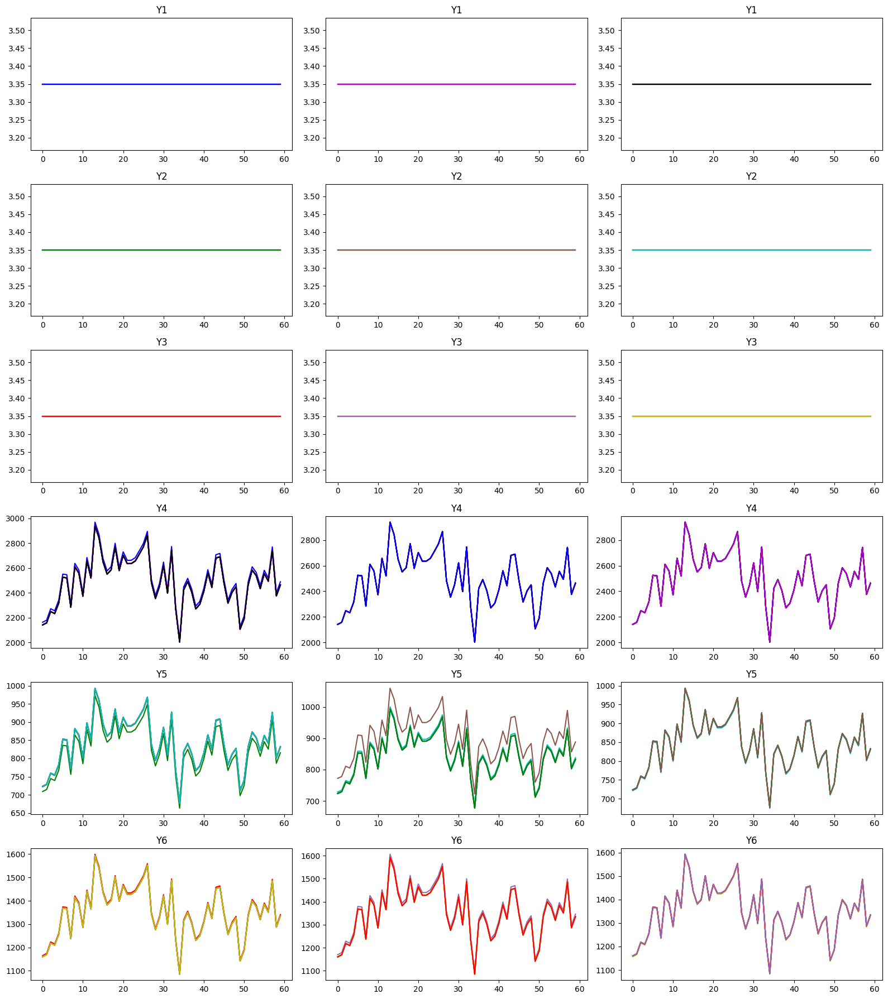

Data8


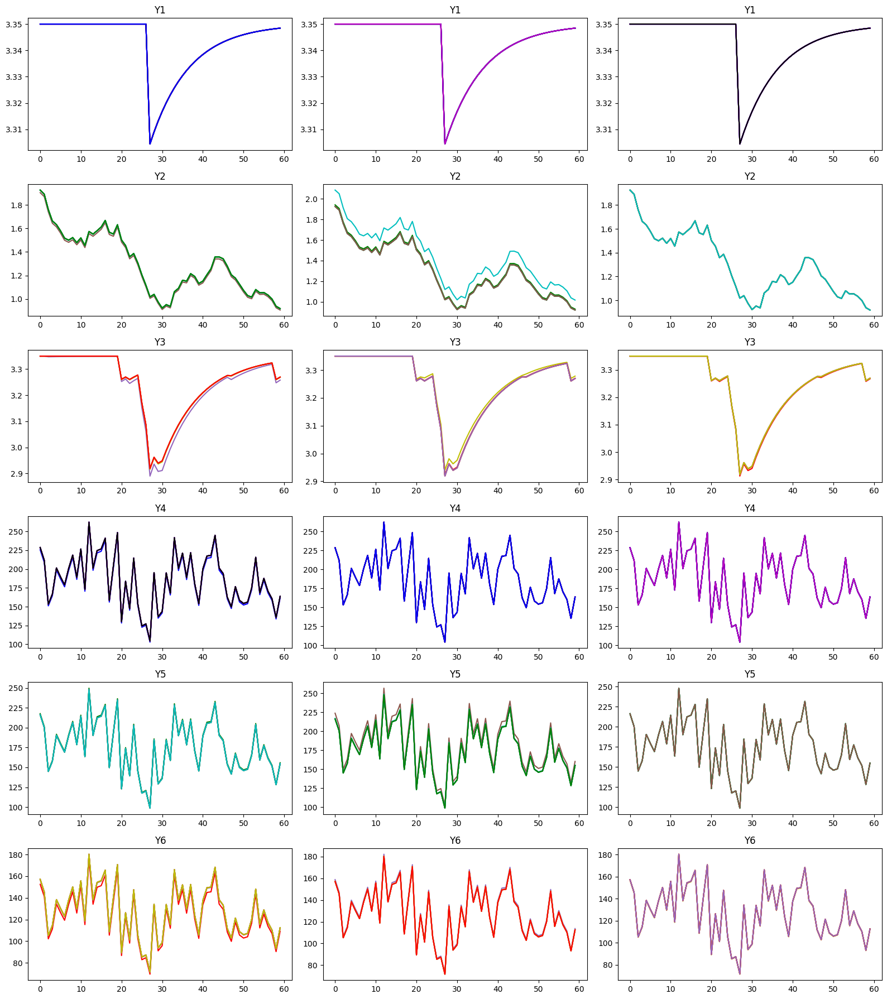

Data9


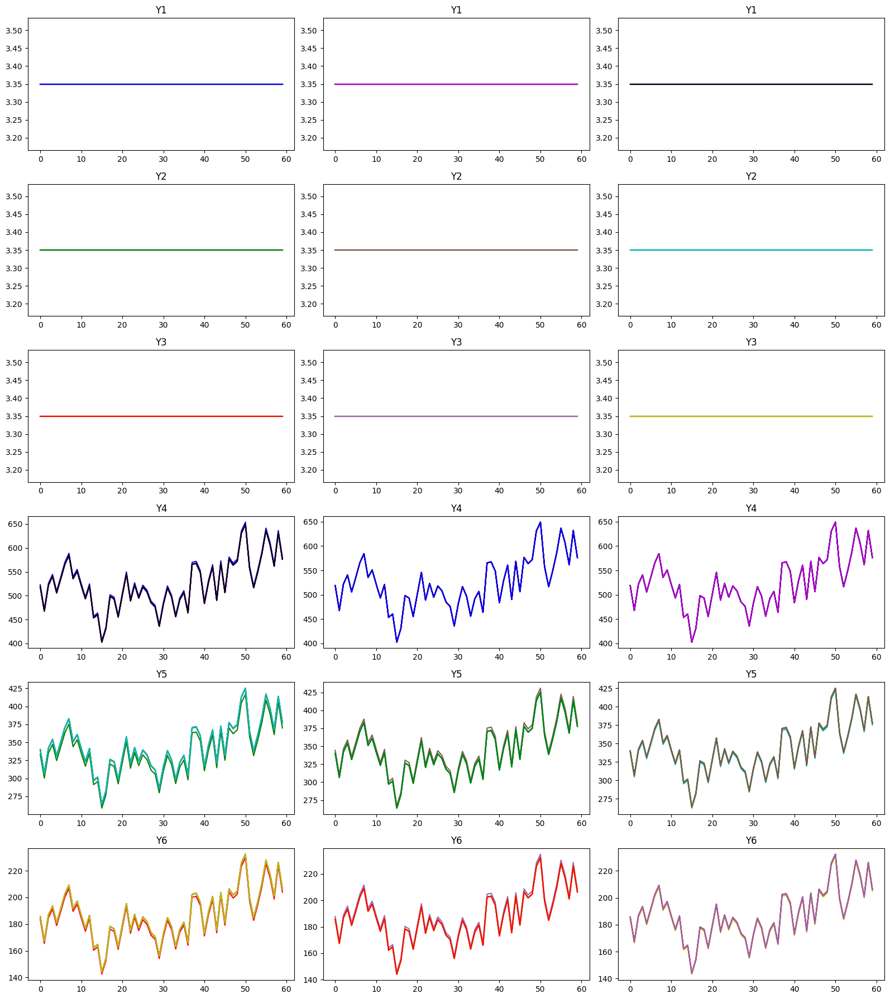

Data10


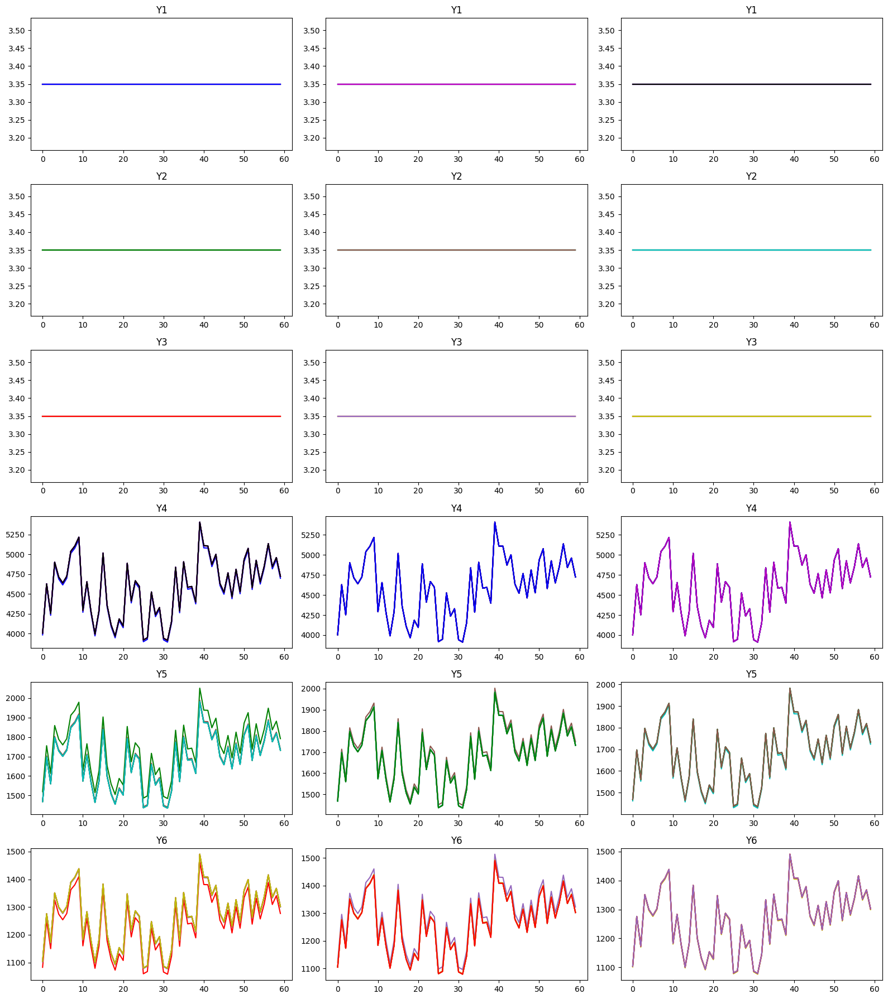

Data11


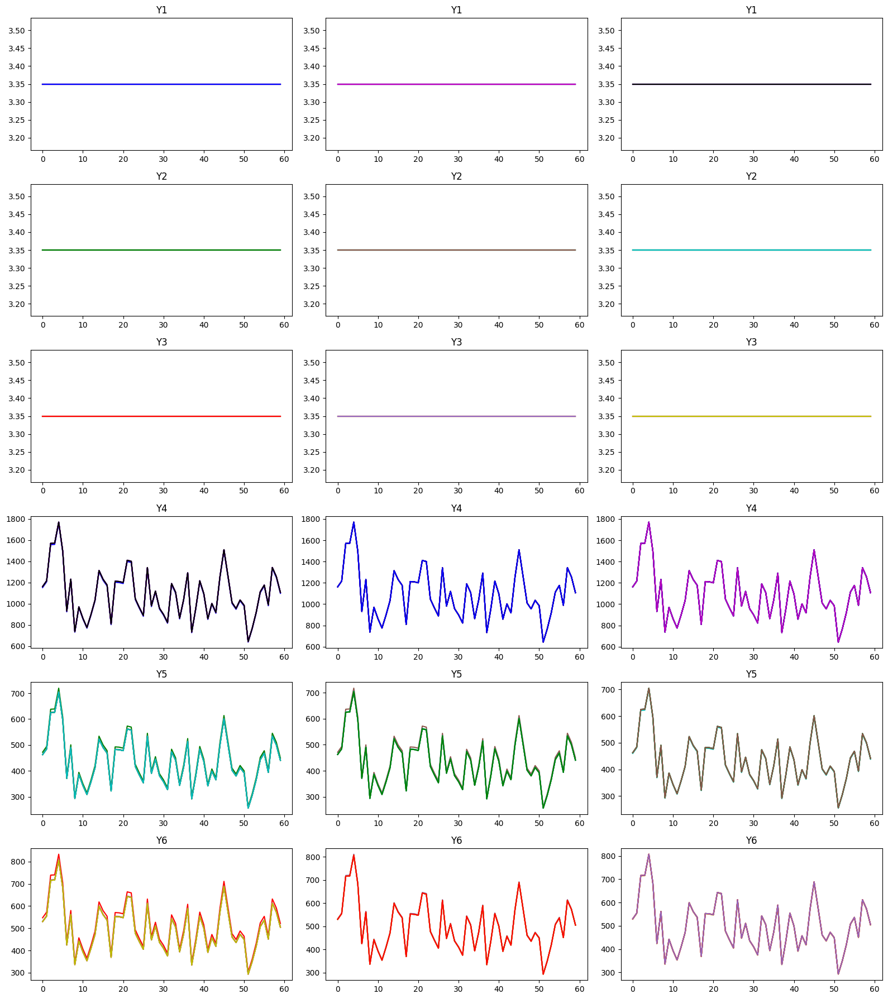

In [111]:
for i, df in enumerate(dfs):
    print(f'Data{i+2}')
    plot_all_outputs_based_on_inputs(df, df_inputs=input_dfs[i])
    

# TODO: Look at Xc change in the same manner like here. 

In [112]:
dfs = [pd.read_csv(f'Y_out3{i}.csv', header=None) for i in range(1, 11)]
for df in dfs:
    df.columns = [f'Y{i}' for i in range(1, 8)]
input_dfs = [pd.read_csv(f'shifting_X_c{i}.txt', header=None) for i in range(1, 11)]
for df in input_dfs:
    df.columns = [f'X{i}' for i in range(1, 10)]


In [113]:
dfs[3]

,Y1,Y2,Y3,Y4,Y5,Y6,Y7
0,3.35,3.35,3.35,5503.620228,2562.807033,2787.557506,1
1,3.35,3.35,3.35,3845.625542,1790.747867,1947.791072,1
2,3.35,3.35,3.35,3871.665661,1802.873668,1960.980269,1
3,3.35,3.35,3.35,4140.408851,1928.016194,2097.097418,1
4,3.35,3.35,3.35,3747.906251,1745.244058,1898.296715,1
...,...,...,...,...,...,...,...
1375,3.35,3.35,3.35,4668.932774,2174.127802,2364.792275,23
1376,3.35,3.35,3.35,3935.434585,1832.568203,1993.278926,23
1377,3.35,3.35,3.35,4172.495902,1942.957799,2113.349357,23
1378,3.35,3.35,3.35,4257.320889,1982.457267,2156.312810,23


In [114]:
input_dfs[3]

,X1,X2,X3,X4,X5,X6,X7,X8,X9
0,0.916073,0.984978,0.951516,0.553485,0.438434,0.660660,0.815836,0.129488,48451641.0
1,0.916073,0.984978,0.951516,0.553485,0.438434,0.760660,0.815836,0.129488,48451641.0
2,0.916073,0.984978,0.951516,0.553485,0.438434,0.670660,0.815836,0.129488,48451641.0
3,0.916073,0.984978,0.951516,0.553485,0.438434,0.661660,0.815836,0.129488,48451641.0
4,0.916073,0.984978,0.951516,0.553485,0.438434,0.660760,0.815836,0.129488,48451641.0
5,0.916073,0.984978,0.951516,0.553485,0.438434,0.660670,0.815836,0.129488,48451641.0
6,0.916073,0.984978,0.951516,0.553485,0.438434,0.660661,0.815836,0.129488,48451641.0
7,0.916073,0.984978,0.951516,0.553485,0.438434,0.660660,0.815836,0.129488,48451641.0
8,0.916073,0.984978,0.951516,0.553485,0.438434,0.660660,0.915836,0.129488,48451641.0
9,0.916073,0.984978,0.951516,0.553485,0.438434,0.660660,0.825836,0.129488,48451641.0


In [128]:
sims = [ts_similarity_all(df, dist_type='euclidean') for df in dfs]
groups = [(create_group(sim_dfs[0], xe = 3),
            create_group(sim_dfs[1], xe = 4),
            create_group(sim_dfs[2], xe = 5)) for sim_dfs in sims]

for i, (d1, d2, d3) in enumerate(groups):
    print(f'Data {i+2}')
    print(is_group(d1, xe = 3, col= 'Y3'))
    print(is_group(d2, xe = 4, col= 'Y3'))
    print(is_group(d3, xe = 5, col= 'Y3'))
    print('*'*20)

Data 2
0.0
0.0
0.0
********************
Data 3
0.0
0.0
0.0
********************
Data 4
0.0
0.0
0.0
********************
Data 5
0.0
0.0
0.0
********************
Data 6
0.0
0.0
0.0
********************
Data 7
0.0
-2.541098841762901e-20
-1.5246593050577406e-20
********************
Data 8
0.0
0.0
0.0
********************
Data 9
0.0
0.0
0.0
********************
Data 10
0.0
0.0
0.0
********************
Data 11
0.0
0.0
0.0
********************


In [121]:
sims[0][0]

,Y1,Y2,Y3,Y4,Y5,Y6
1 vs 1,0.0,0.0,0.0,0.000000,0.000000,0.000000
1 vs 2,0.0,0.0,0.0,1835.776706,44.394845,0.477373
1 vs 3,0.0,0.0,0.0,189.780199,15.728518,0.621910
1 vs 4,0.0,0.0,0.0,19.035294,1.706110,0.070518
1 vs 5,0.0,0.0,0.0,1.904097,0.171962,0.007137
1 vs 6,0.0,0.0,0.0,0.190415,0.017210,0.000715
1 vs 7,0.0,0.0,0.0,0.019042,0.001721,0.000071
2 vs 2,0.0,0.0,0.0,0.000000,0.000000,0.000000
2 vs 3,0.0,0.0,0.0,1645.996506,28.666327,1.099283
2 vs 4,0.0,0.0,0.0,1816.741412,42.688735,0.547891


Data 2


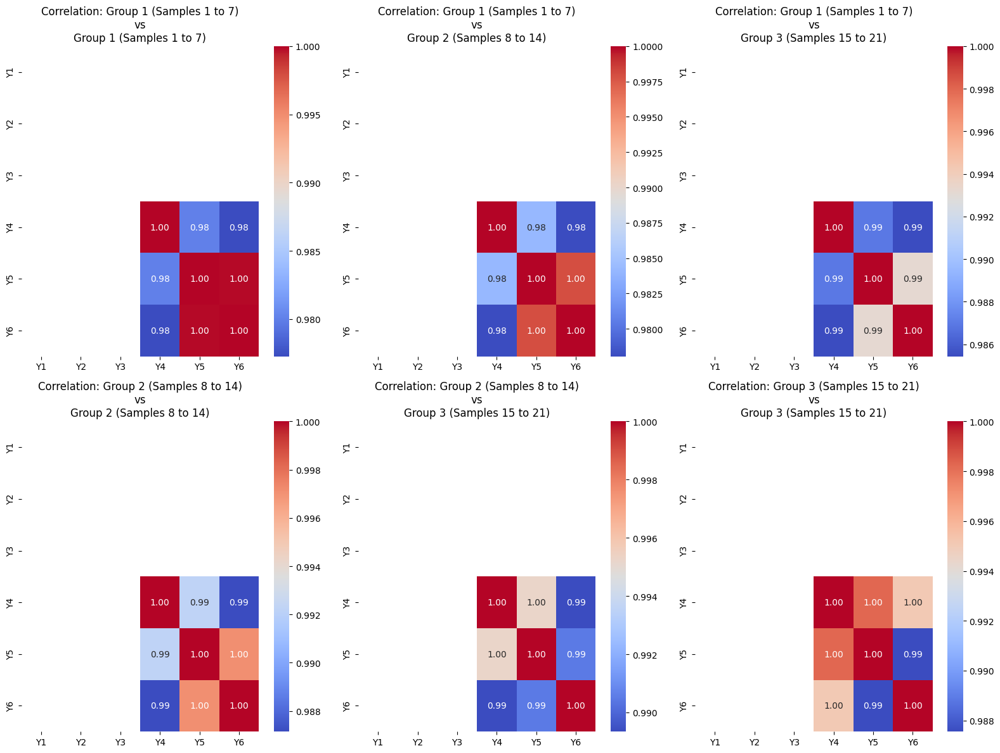

Data 3


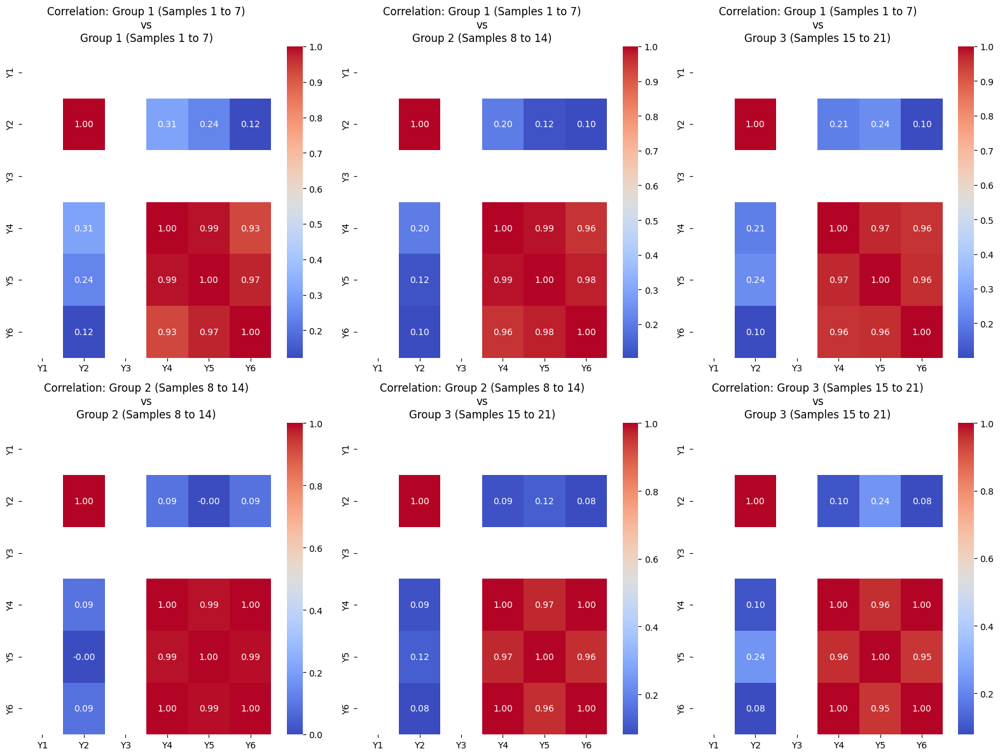

Data 4


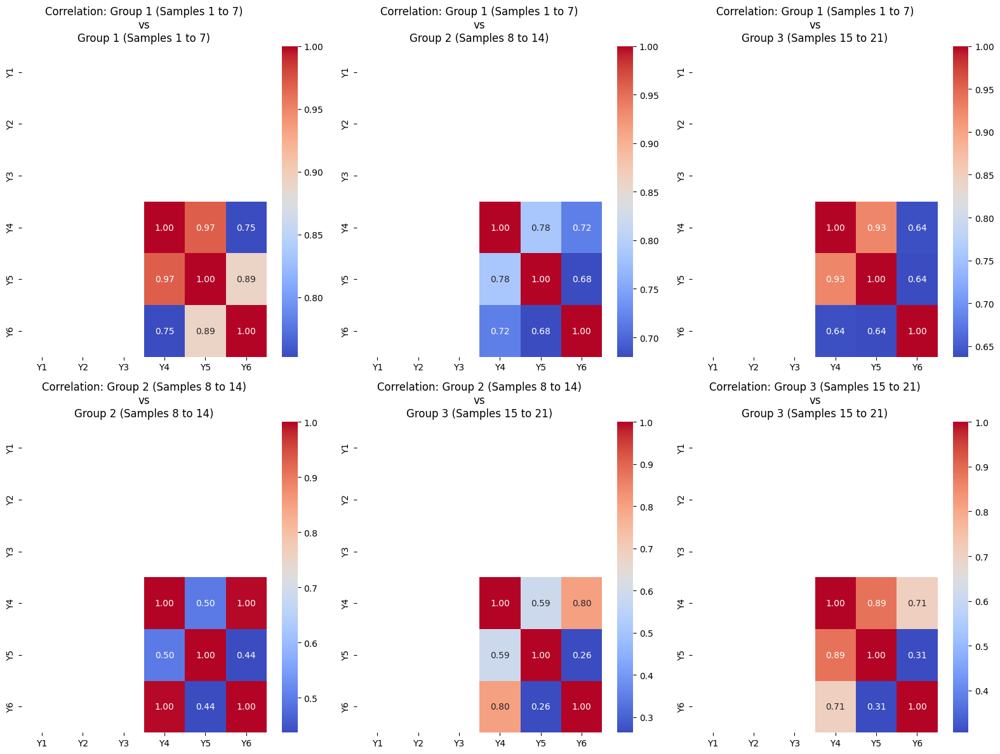

Data 5


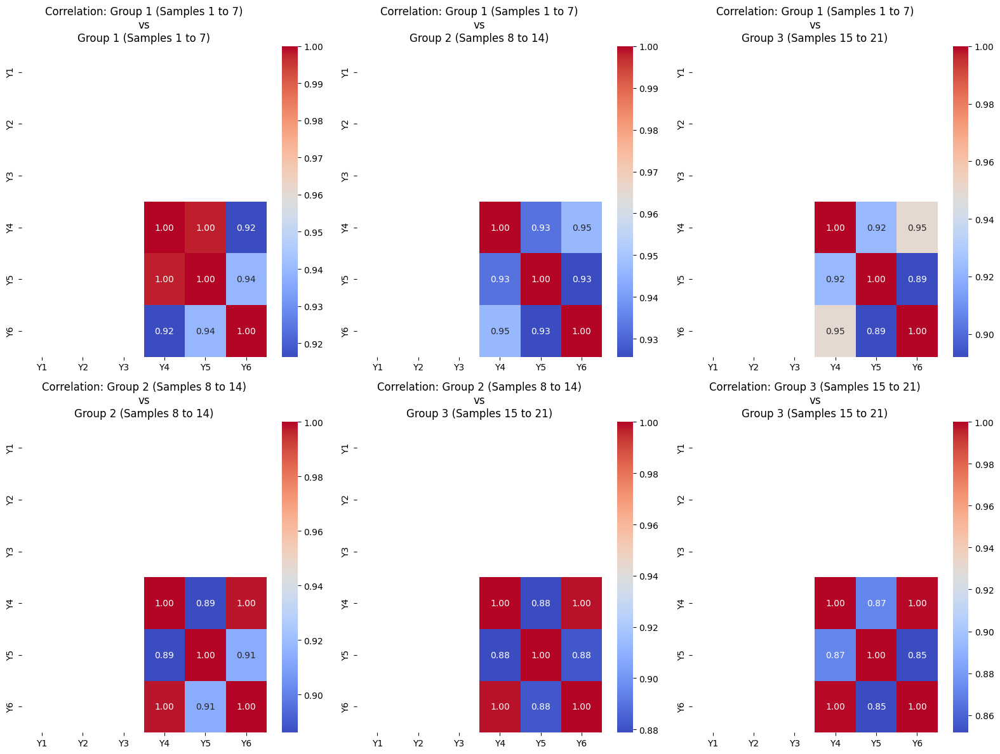

Data 6


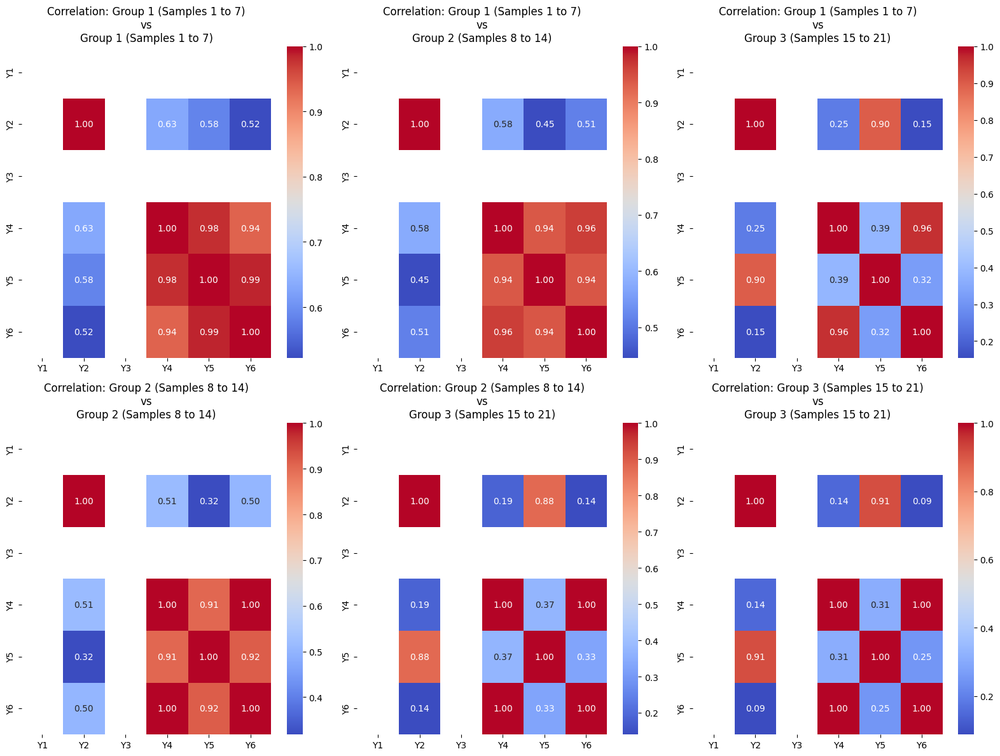

Data 7


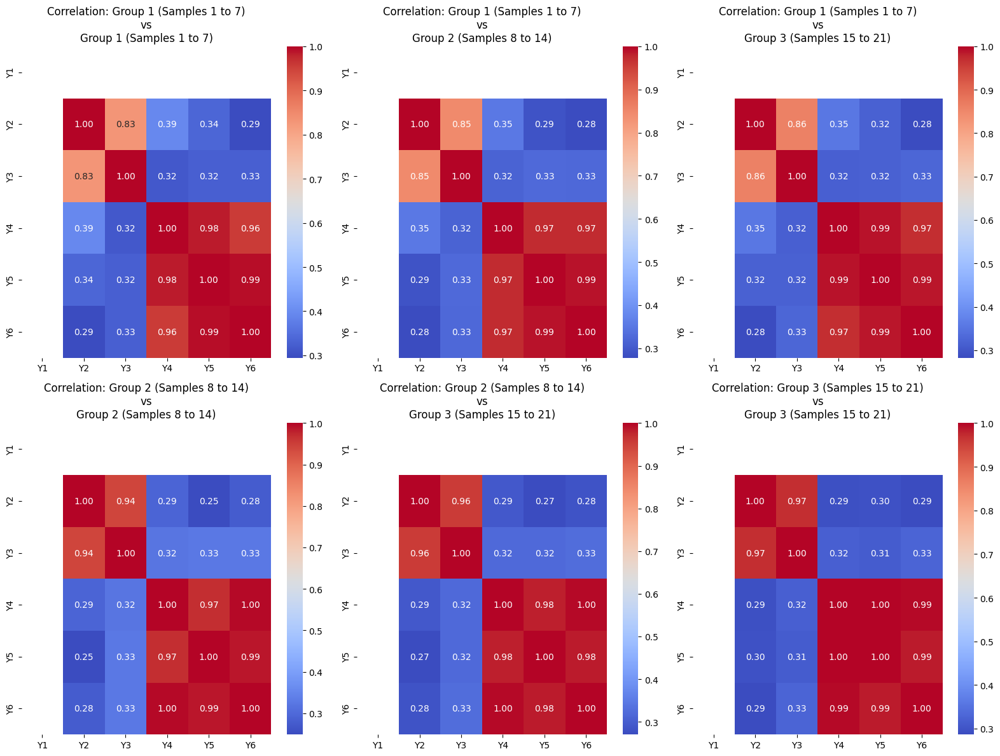

Data 8


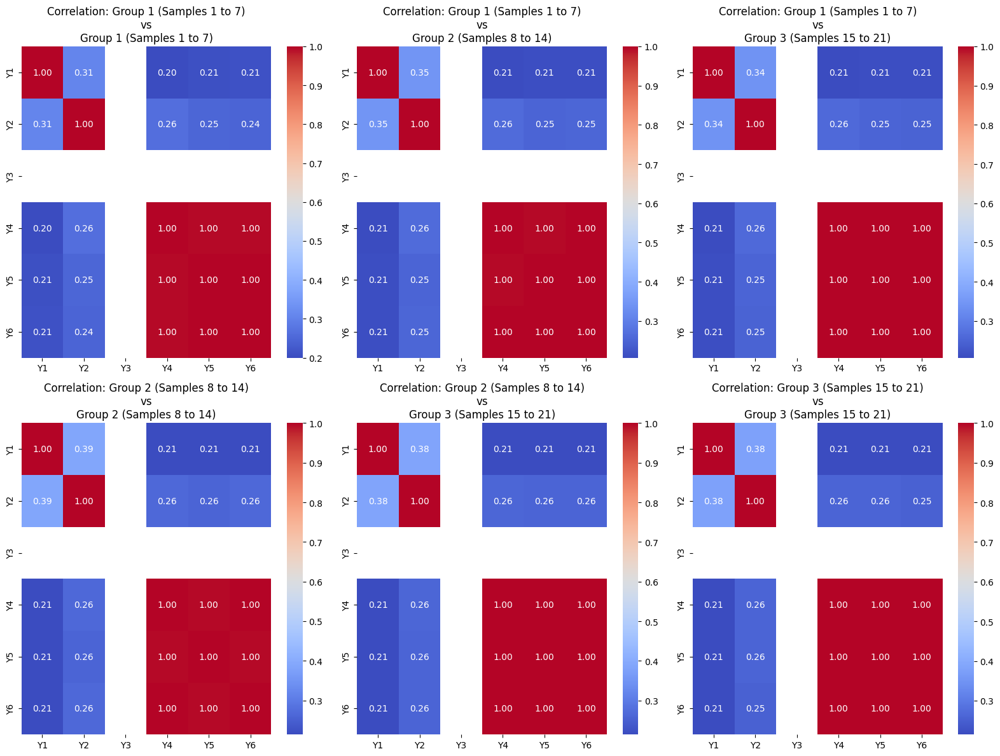

Data 9


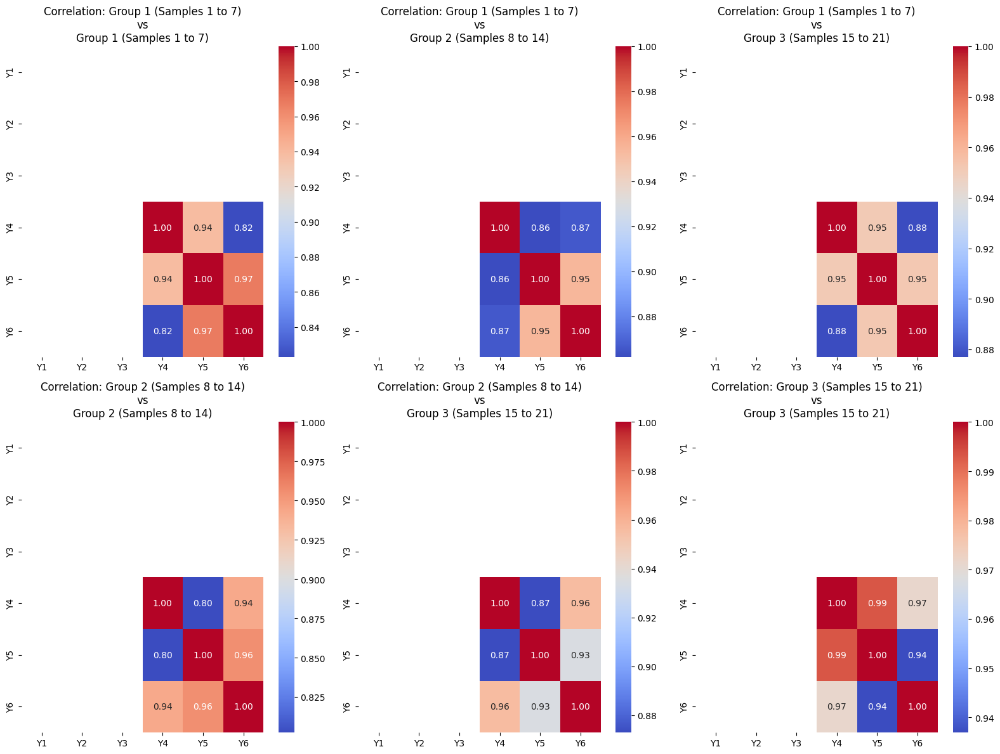

Data 10


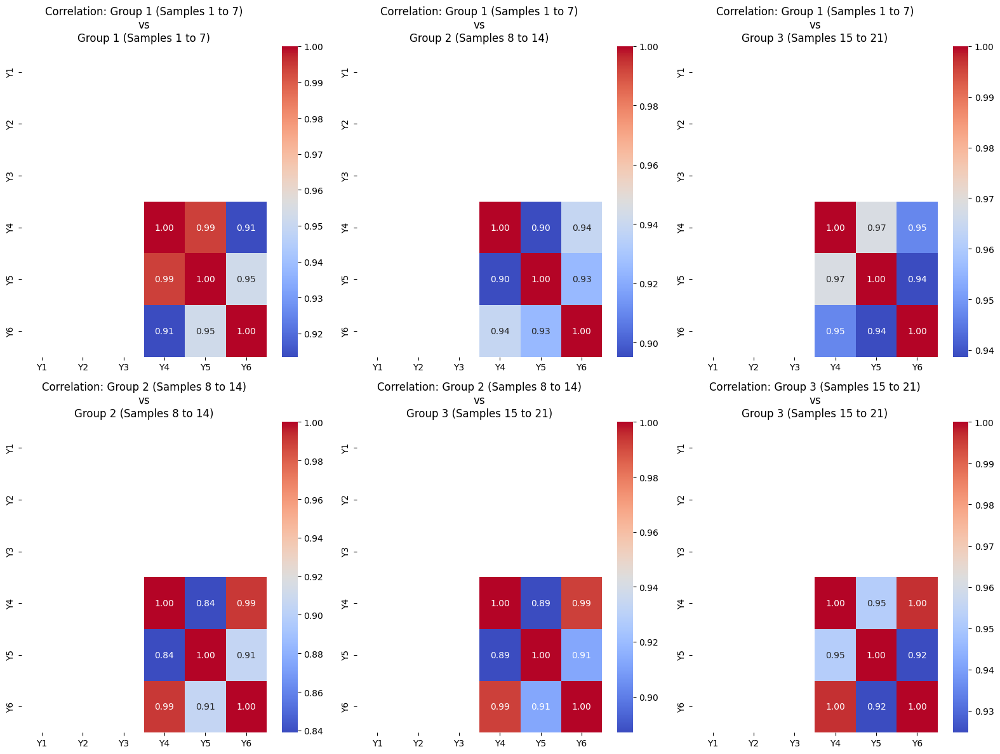

Data 11


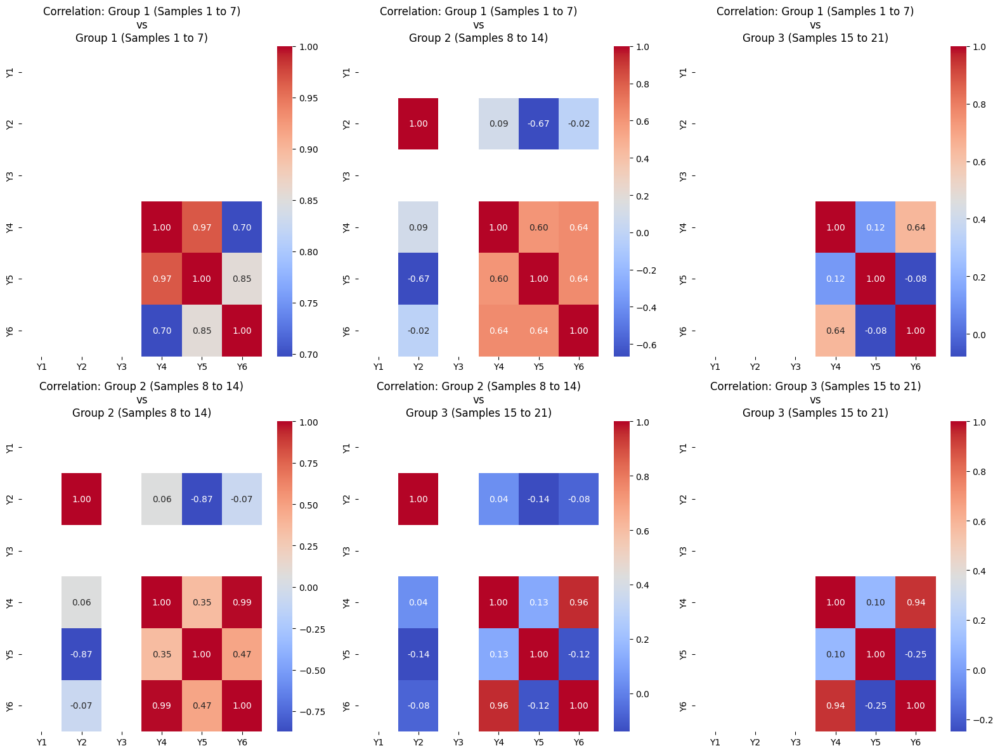

In [118]:
for i, df in enumerate(dfs):
    print(f'Data {i+2}')
    correlation_between_ts(df)

Data2


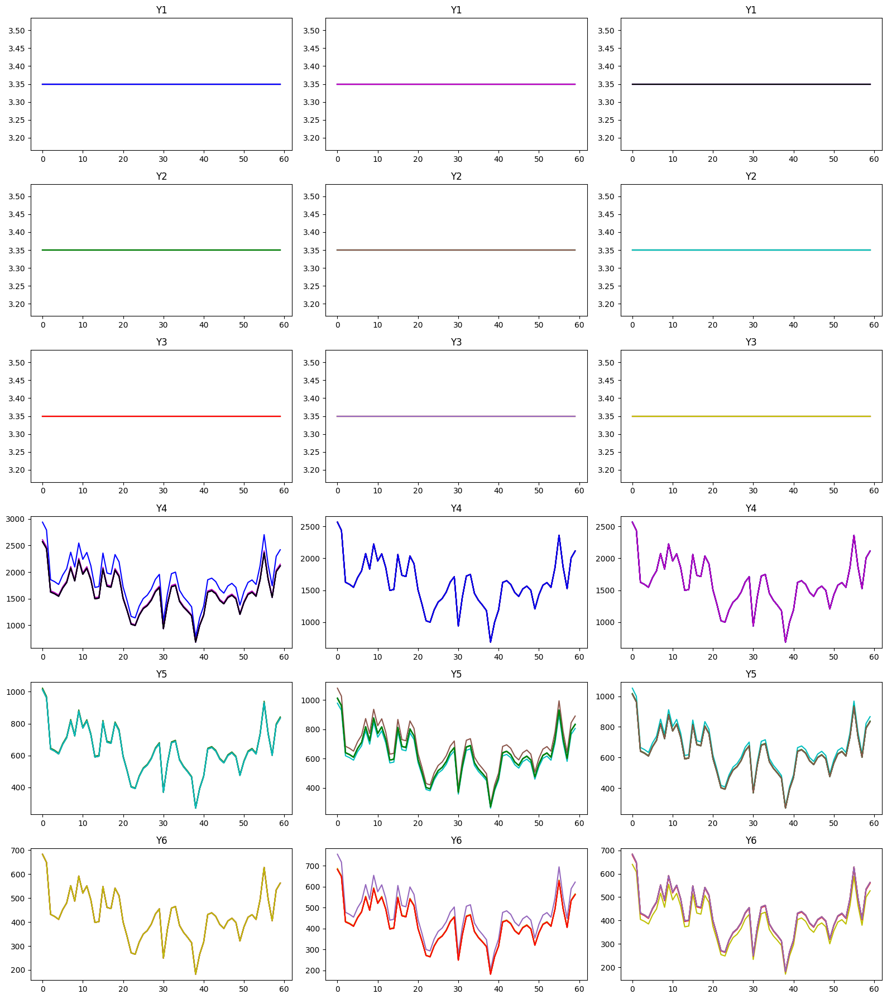

Data3


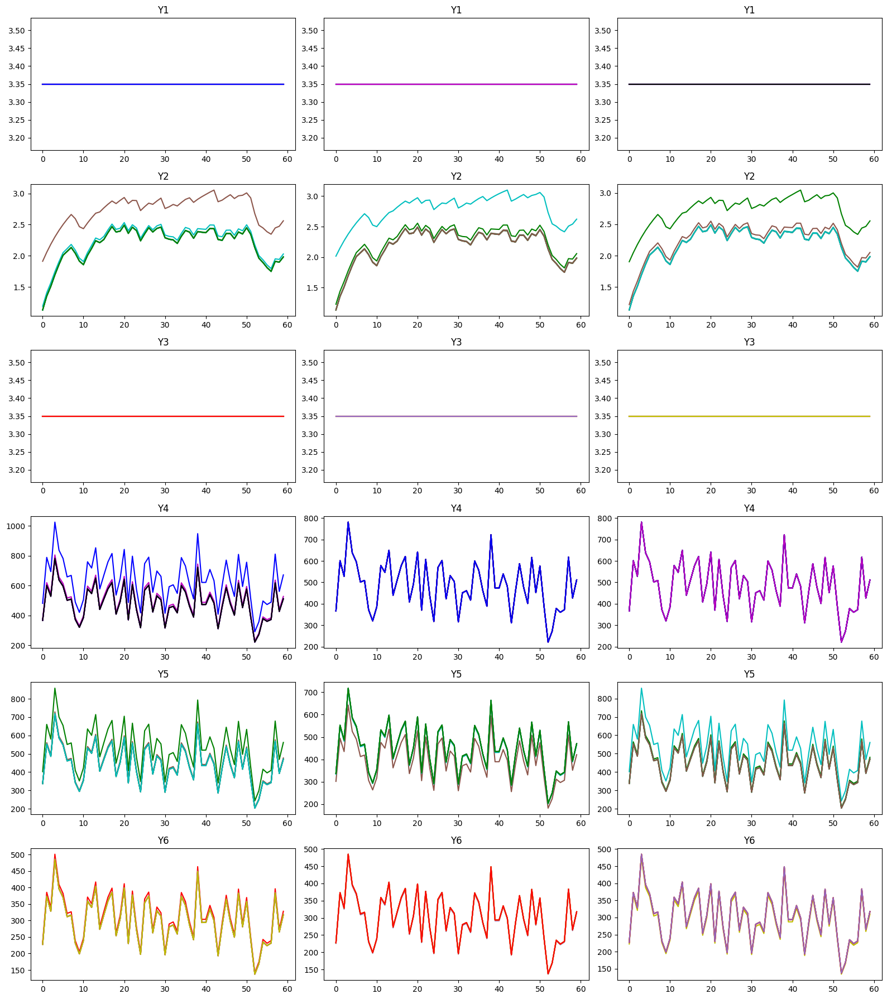

Data4


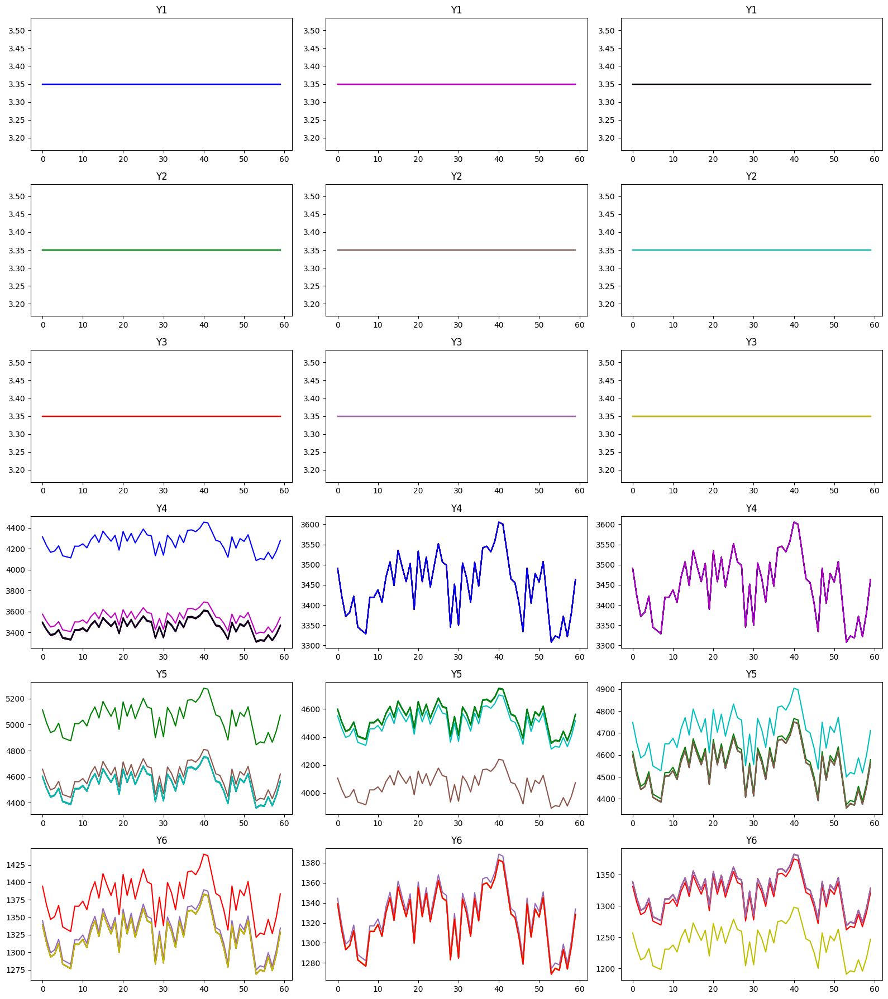

Data5


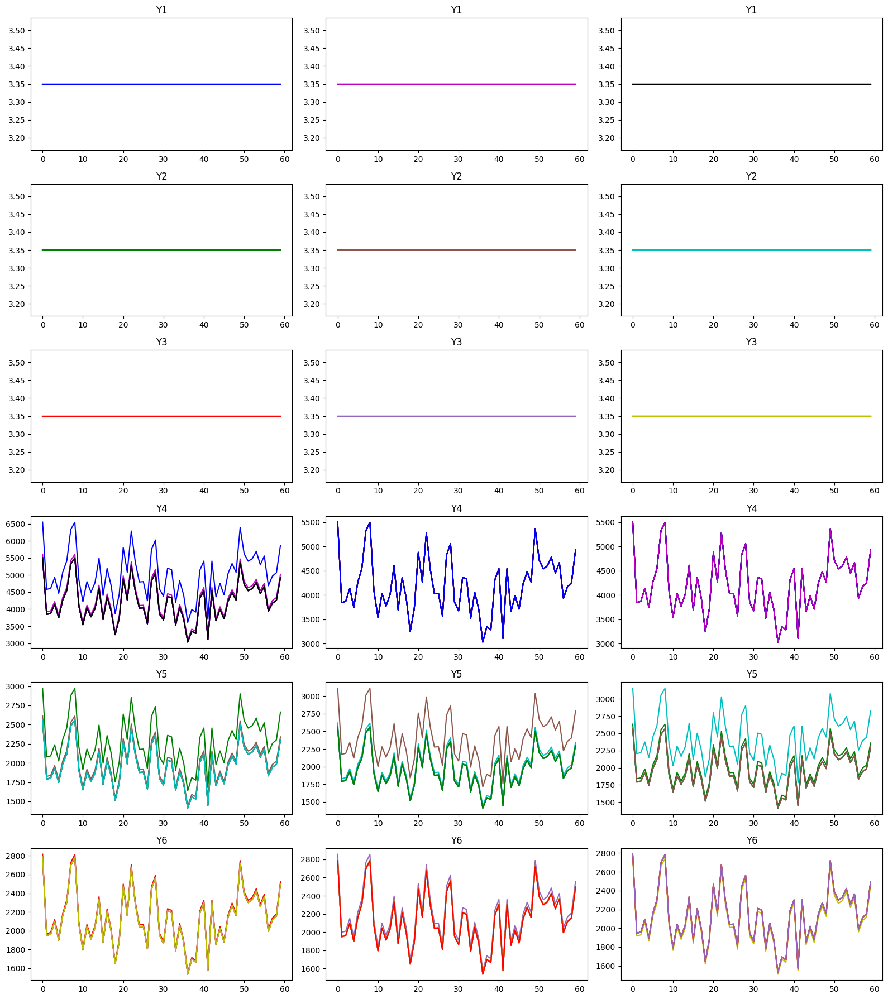

Data6


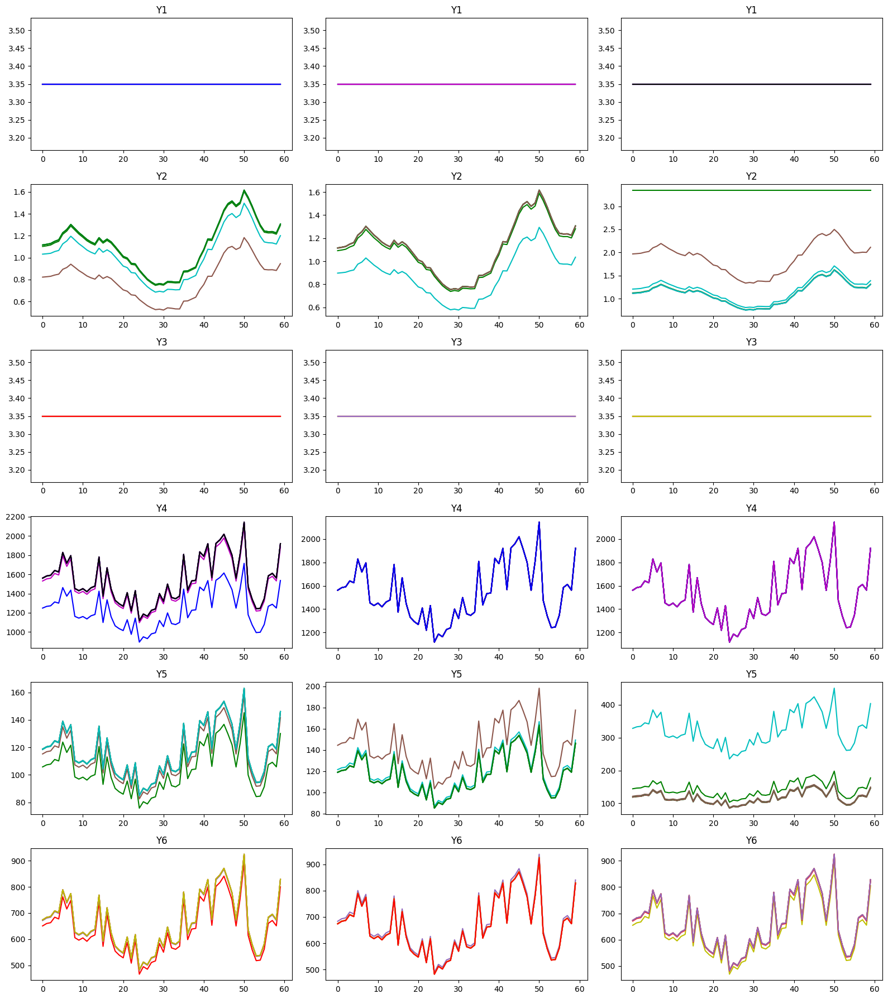

Data7


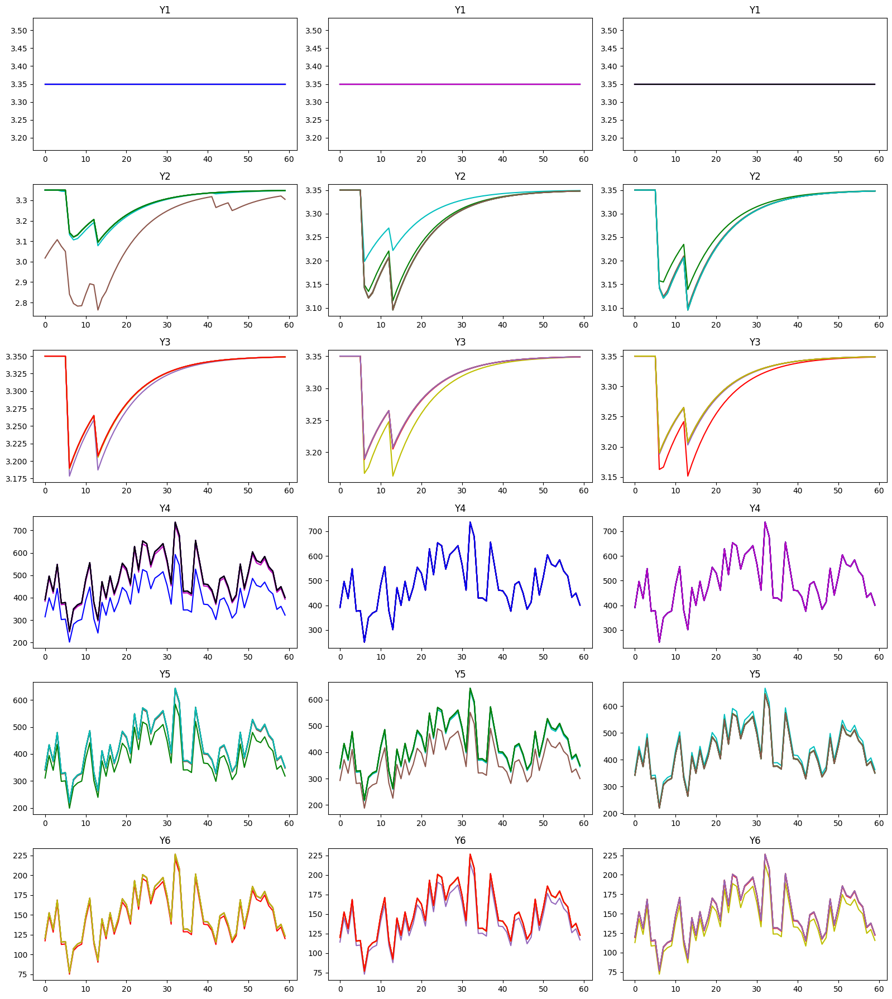

Data8


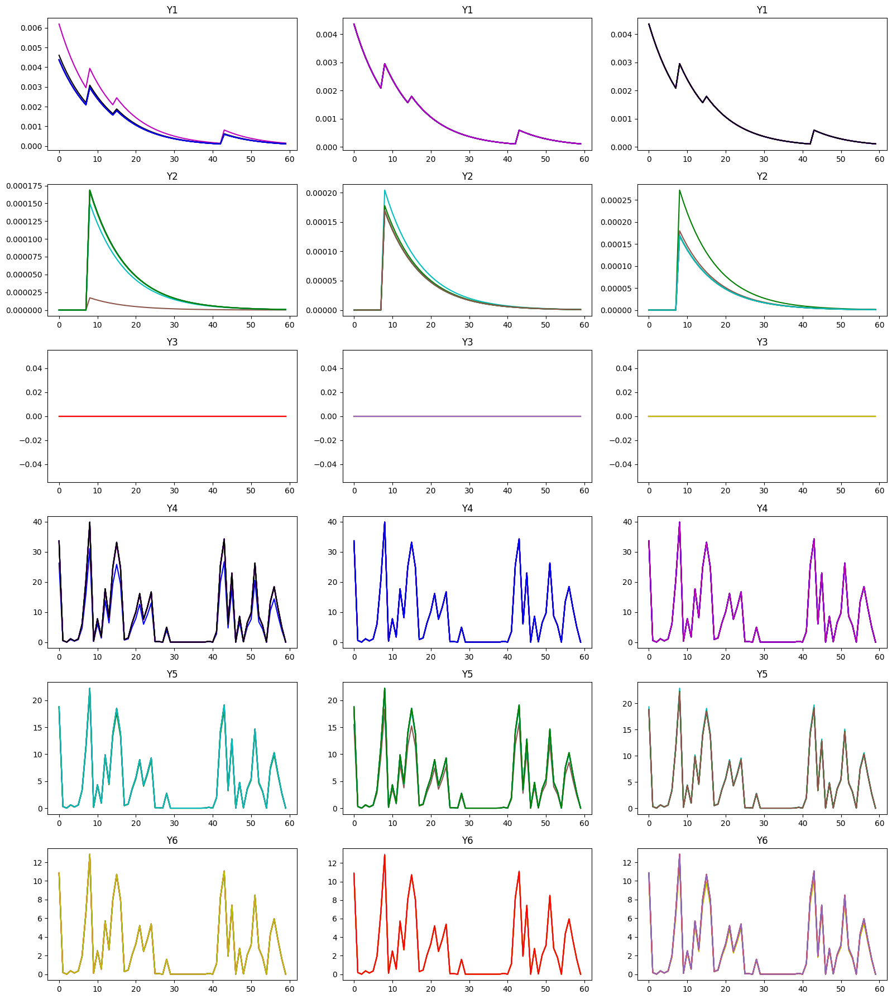

Data9


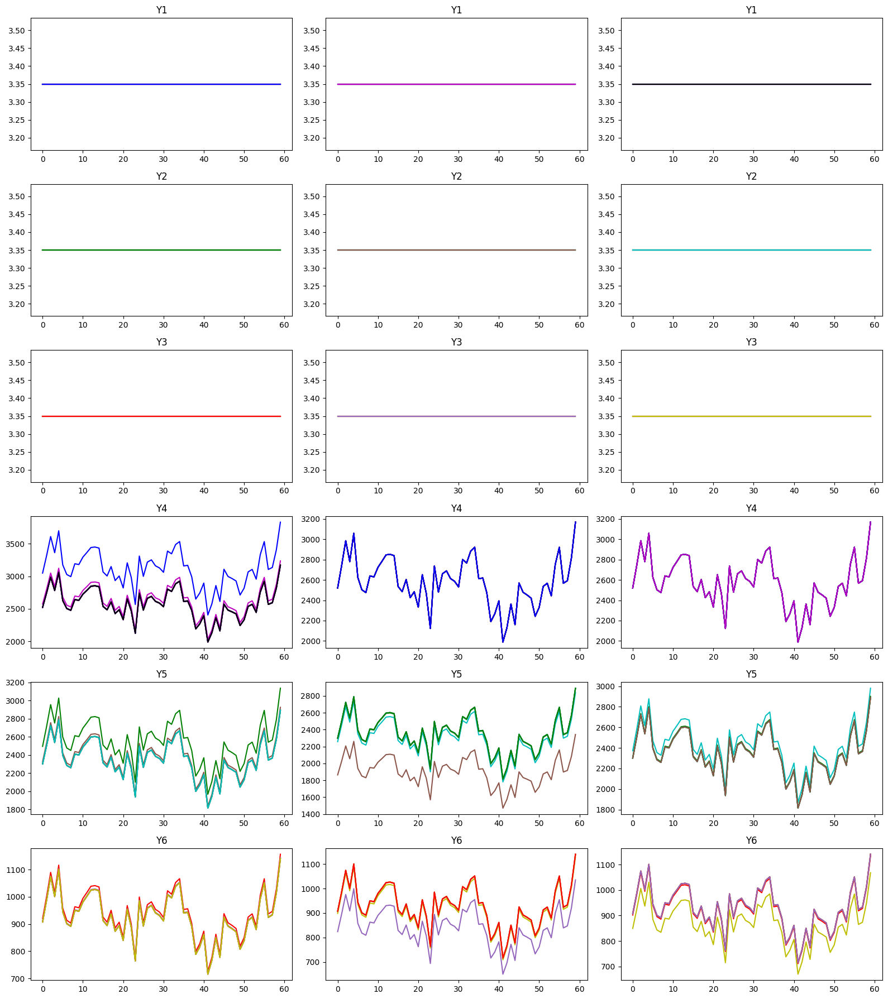

Data10


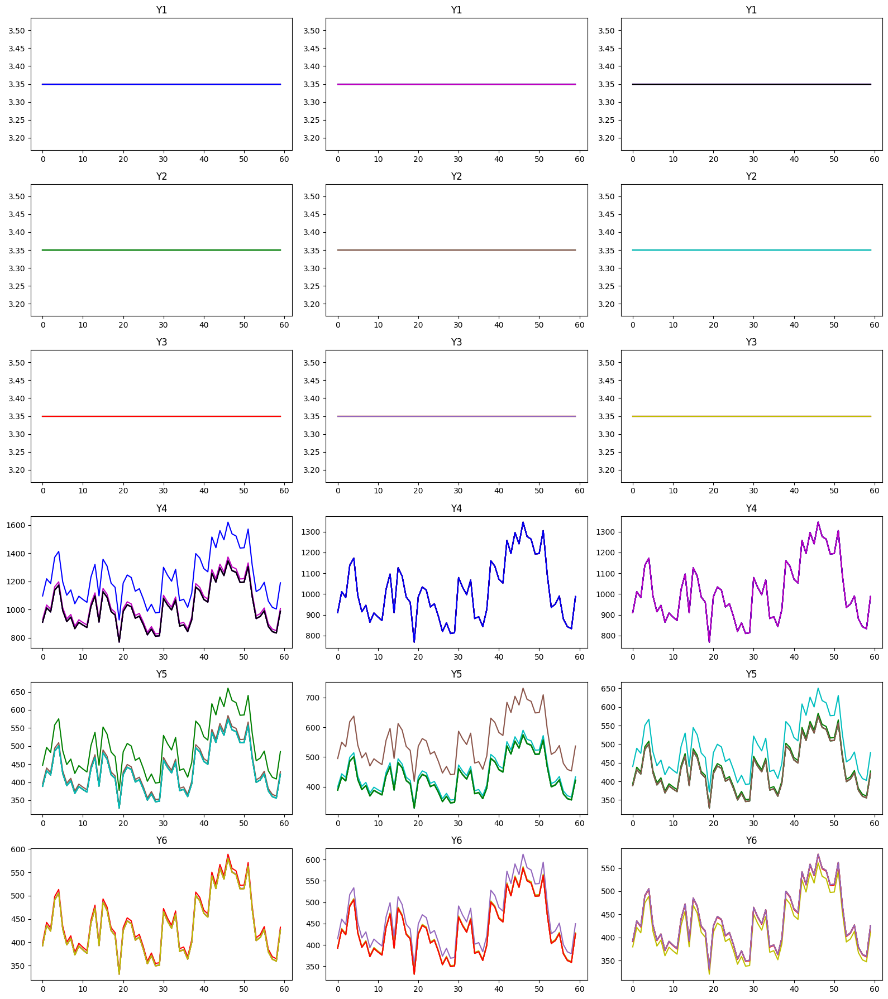

Data11


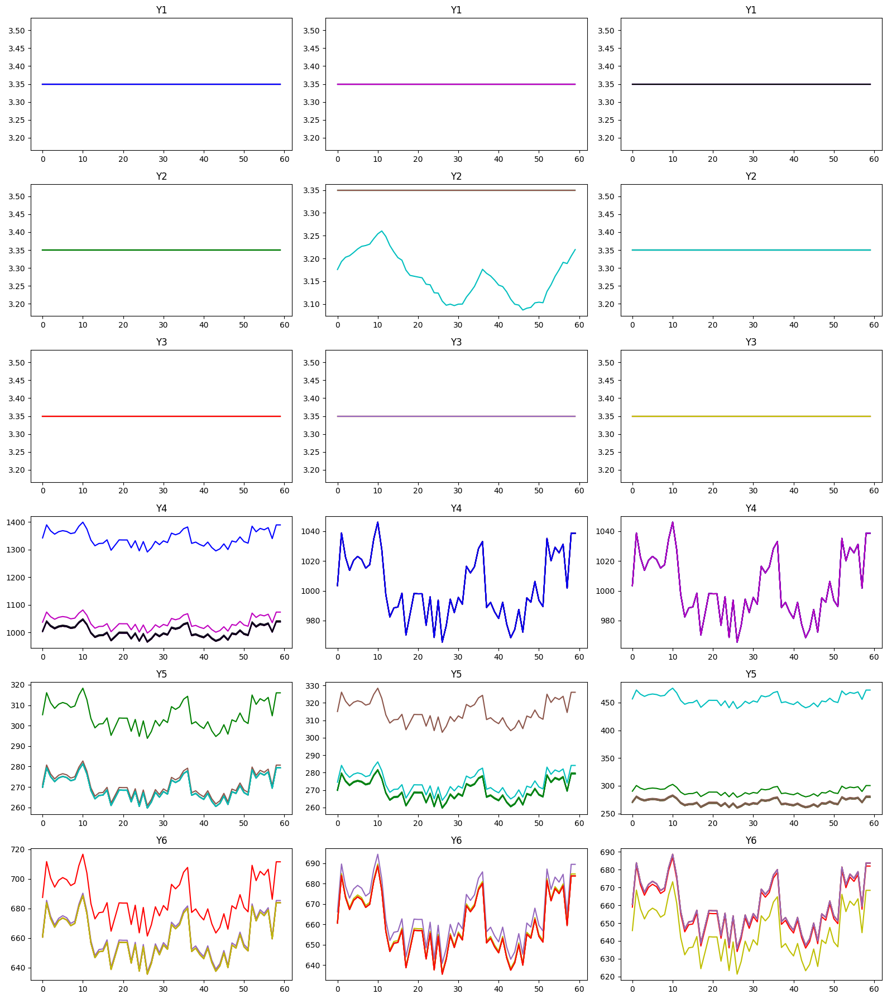

In [119]:
for i, df in enumerate(dfs):
    print(f'Data{i+2}')
    plot_all_outputs_based_on_inputs(df, df_inputs=input_dfs[i])

In [130]:
sims[1][0]

,Y1,Y2,Y3,Y4,Y5,Y6
1 vs 1,0.0,0.000000,0.0,0.000000,0.000000,0.000000
1 vs 2,0.0,4.237718,0.0,1213.469339,693.133252,78.428145
1 vs 3,0.0,0.377715,0.0,122.266860,52.066697,7.309313
1 vs 4,0.0,0.036341,0.0,12.232784,5.007479,0.717213
1 vs 5,0.0,0.003621,0.0,1.223336,0.498744,0.071576
1 vs 6,0.0,0.000362,0.0,0.122334,0.049854,0.007156
1 vs 7,0.0,0.000036,0.0,0.012233,0.004985,0.000716
2 vs 2,0.0,0.000000,0.0,0.000000,0.000000,0.000000
2 vs 3,0.0,3.861161,0.0,1091.202479,641.066555,71.118832
2 vs 4,0.0,4.201488,0.0,1201.236554,688.125773,77.710932


In [174]:
st = is_monotone(dfs[0], input_dfs[0], xe='X6')

['X6', 'X7', 'X8']
[array([[ True,  True,  True, False, False,  True],
       [ True,  True,  True, False, False,  True],
       [ True,  True,  True, False, False,  True],
       [ True,  True,  True, False, False,  True],
       [ True,  True,  True, False, False,  True],
       [ True,  True,  True, False, False,  True],
       [ True,  True,  True, False, False,  True],
       [ True,  True,  True, False, False,  True],
       [ True,  True,  True, False, False,  True],
       [ True,  True,  True, False, False,  True],
       [ True,  True,  True, False, False,  True],
       [ True,  True,  True, False, False,  True],
       [ True,  True,  True, False, False,  True],
       [ True,  True,  True, False, False,  True],
       [ True,  True,  True, False, False,  True],
       [ True,  True,  True, False, False,  True],
       [ True,  True,  True, False, False,  True],
       [ True,  True,  True, False, False,  True],
       [ True,  True,  True, False, False,  True],
       [ Tr

ValueError: Must pass 2-d input. shape=(21, 60, 6)

In [173]:
st[(st['Y4'] == False) | (st['Y5'] == False) | (st['Y6'] == False)]

,Input_Monotonicity,Inputs_Pair,Inputs_Pair_vals,Y1,Y2,Y3,Y4,Y5,Y6
13,True,"(2, 5)","(0.7758914756885005, 0.7748924756885006)",True,True,True,False,False,False
14,True,"(2, 6)","(0.7758914756885005, 0.7748915756885005)",True,True,True,False,False,False
16,True,"(3, 5)","(0.7749914756885005, 0.7748924756885006)",True,True,True,False,False,False
17,True,"(3, 6)","(0.7749914756885005, 0.7748915756885005)",True,True,True,False,False,False
18,True,"(4, 5)","(0.7749014756885004, 0.7748924756885006)",True,True,True,False,False,False
19,True,"(4, 6)","(0.7749014756885004, 0.7748915756885005)",True,True,True,False,False,False
20,True,"(5, 6)","(0.7748924756885006, 0.7748915756885005)",True,True,True,False,False,False
34,True,"(9, 12)","(0.5780527616235652, 0.5770537616235654)",True,True,True,False,False,False
35,True,"(9, 13)","(0.5780527616235652, 0.5770528616235653)",True,True,True,False,False,False
37,True,"(10, 12)","(0.5771527616235653, 0.5770537616235654)",True,True,True,False,False,False


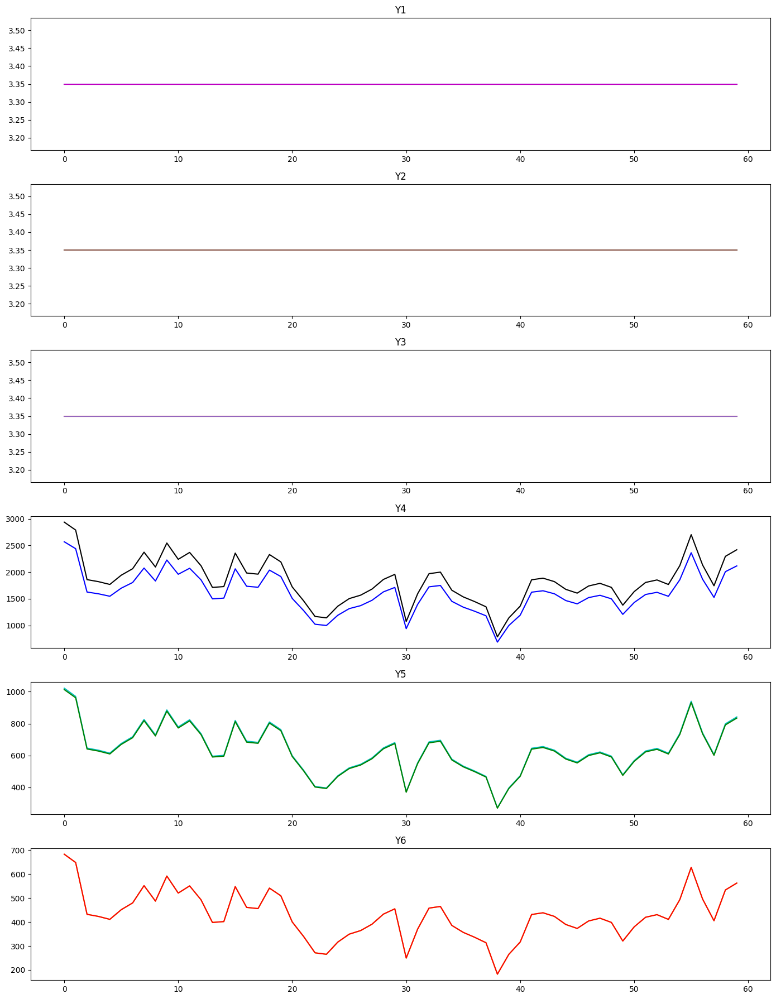

In [157]:
plot_all_outputs(dfs[0][dfs[0]['Y7'].isin([2,5])])

In [ ]:
for df in dfs:
    is_monotone(df)